In [1]:
!nvidia-smi
!lscpu
!free -h
!cat /etc/os-release
!df -h

Mon Aug 17 05:58:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.159.04             Driver Version: 580.159.04     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
SEED = 42
INFERENCE_BATCH_SIZE = 64

LR = 1e-3
WEIGHT_DECAY = 0.05
FL_GAMMA = 2.0
NUM_WORKERS = 3

CONFIGS = {
    "HKU": {
        "name": "HKU",
        "patch_size": 32,
        "data_path": "/kaggle/input/datasets/labsys443/tilda-hku-patched/hku_32",
        "test_set_path": "/kaggle/input/datasets/labsys443/tilda-hku-patched/hku_32/test_set_32.h5",
        "model_ckpt": "/kaggle/input/datasets/labsys443/final-models-v1/final_models_v1/hku32_fvit_base/final_production_model.ckpt",
        "masks_dir": "/kaggle/input/datasets/labsys443/hku-dataset",
        "class_names": ['good', 'broken', 'hole', 'netting', 'thick', 'thin', 'knots']
    },
    "TILDA": {
        "name": "TILDA",
        "patch_size": 64,
        "data_path": "/kaggle/input/datasets/labsys443/tilda-hku-patched/tilda_64",
        "test_set_path": "/kaggle/input/datasets/labsys443/tilda-hku-patched/tilda_64/test_set_64.h5",
        "model_ckpt": "/kaggle/input/datasets/labsys443/final-models-v1/final_models_v1/tilda64_fvit_base/final_production_model.ckpt",
        "masks_dir": "/kaggle/input/datasets/angelolmg/tilda-400/masks",
        "class_names": ['good', 'hole', 'objects', 'oil spot', 'thread error']
    }
}


CLASS_COLORS = {
    1:  (1.0, 0.0, 0.0),    # Class 1: Red
    2:  (0.0, 1.0, 0.0),    # Class 2: Green
    3:  (0.0, 0.5, 1.0),    # Class 3: Dodger Blue
    4:  (1.0, 1.0, 0.0),    # Class 4: Yellow
    5:  (1.0, 0.0, 1.0),    # Class 5: Magenta
    6:  (0.0, 1.0, 1.0),    # Class 6: Cyan
    7:  (1.0, 0.5, 0.0),    # Class 7: Orange
    8:  (0.5, 0.0, 0.5),    # Class 8: Purple
    9:  (0.5, 1.0, 0.0),    # Class 9: Chartreuse / Lime
    10: (1.0, 0.0, 0.5),    # Class 10: Deep Pink
    11: (0.0, 0.5, 0.5),    # Class 11: Teal
    12: (0.6, 0.3, 0.0),    # Class 12: Brown
    13: (0.5, 0.5, 1.0),    # Class 13: Light Slate Blue
    14: (1.0, 0.25, 0.25),  # Class 14: Coral / Bright Salmon
    15: (0.75, 0.75, 0.0)   # Class 15: Olive / Dark Gold
}

In [3]:
import os
import gc
import sys
import json
import time
import copy
import h5py
import random
import logging
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
from tqdm import tqdm
from typing import Union, Dict, Any, Optional, List, Tuple
from sklearn.metrics import f1_score, precision_recall_fscore_support, accuracy_score
import albumentations as A
from albumentations.pytorch import ToTensorV2
from datetime import datetime
from IPython.display import Image, display
from scipy.stats import spearmanr
from pathlib import Path
import cv2
from PIL import Image

from scipy.stats import spearmanr
from scipy.ndimage import label, binary_dilation, binary_erosion

import timm
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, TensorDataset, DataLoader, ConcatDataset
torch.set_float32_matmul_precision('medium')

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, Callback
from pytorch_lightning.loggers import CSVLogger

import torchmetrics
from torchmetrics.classification import (
    MulticlassF1Score, MulticlassAccuracy, MulticlassPrecision, MulticlassRecall,
    BinaryF1Score, BinaryAccuracy, BinaryPrecision, BinaryRecall
)
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

from huggingface_hub.utils import disable_progress_bars
disable_progress_bars()

from kaggle_secrets import UserSecretsClient
# webhook_url = UserSecretsClient().get_secret("DISCORD_WEBHOOK")

!pip freeze > requirements.txt

def setup_logger(output_dir: str = None) -> logging.Logger:
    """
    Configures and returns a structured logger for experiment tracking.
    Outputs to stdout and optionally logs to a text file in output_dir.
    """
    logger = logging.getLogger("experiment")
    logger.setLevel(logging.INFO)
    
    # Prevent duplicate logs if handler is already attached
    if logger.hasHandlers():
        logger.handlers.clear()

    # Define standard log format
    formatter = logging.Formatter(
        fmt="[%(asctime)s] [%(levelname)s] %(message)s",
        datefmt="%Y-%m-%d %H:%M:%S"
    )

    # Console Handler (stdout)
    console_handler = logging.StreamHandler(sys.stdout)
    console_handler.setFormatter(formatter)
    logger.addHandler(console_handler)

    # File Handler (optional: saves log output directly to experiment directory)
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        file_handler = logging.FileHandler(f"{output_dir}/experiment.log")
        file_handler.setFormatter(formatter)
        logger.addHandler(file_handler)

    return logger

def dispatch_discord_notification(
    summary: Dict[str, Any]
) -> None:
    """
    Accepts experiment output dictionary, formats message payload, and posts to Discord via Kaggle Secrets.
    """
    logger = logging.getLogger("experiment")
    

    # Build metric summary lines
    metric_lines = [
        f"• **{metric}**: `{data['mean']:.4f} ± {data['std']:.4f}`"
        for metric, data in summary["cv_summary"].items()
    ]
    metrics_block = "\n".join(metric_lines)
    
    ratio_str = f"`{summary['undersample_ratio']}`" if summary['undersample_ratio'] is not None else "`N/A`"

    message = (
        f"**Training Pipeline Execution Complete**\n\n"
        f"**Experiment Configuration:**\n"
        f"• **Dataset:** `{summary['dataset_name']}`\n"
        f"• **Patch Size:** `{summary['resolution']}x{summary['resolution']} px`\n"
        f"• **Model:** `{summary['model_name']}`\n"
        f"• **Experiment Type:** `{summary['experiment_type'].upper()}`\n"
        f"• **Undersample Ratio:** {ratio_str}\n"
        f"• **Total Execution Time:** `{summary['execution_time']}`\n\n"
        f"**Cross-Validation Summary Report (5-Fold):**\n"
        f"{metrics_block}"
    )

    payload = json.dumps({"content": message}).encode("utf-8")
    headers = {
        "Content-Type": "application/json",
        "User-Agent": "PyTorch-Lightning-Pipeline"
    }

    try:
        req = urllib.request.Request(webhook_url, data=payload, headers=headers)
        with urllib.request.urlopen(req) as response:
            if response.status in (200, 204):
                logger.info("Discord notification sent successfully.")
            else:
                logger.warning(f"Discord API HTTP status: {response.status}")
    except Exception as e:
        logger.warning(f"Failed to deliver Discord webhook: {e}")

def set_seed(seed=42):
    pl.seed_everything(seed, workers=True)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(SEED)

Seed set to 42


In [4]:
SE_DISK_7x7 = np.array([
    [0, 0, 1, 1, 1, 0, 0],
    [0, 1, 1, 1, 1, 1, 0],
    [1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1, 1, 1],
    [0, 1, 1, 1, 1, 1, 0],
    [0, 0, 1, 1, 1, 0, 0]
], dtype=bool)

# 3x3 Cross Structuring Element (Disk of radius 1, 4-connected topology)
# Requires a minimum cluster of 5 contiguous patches (center + 4 orthogonal neighbors) to survive erosion.
SE_DISK_3x3 = np.array([
    [0, 1, 0],
    [1, 1, 1],
    [0, 1, 0]
], dtype=bool)

# 3x3 Box Structuring Element (8-connected topology)
# Requires a full 3x3 block (9 contiguous patches) to survive erosion.
SE_BOX_3x3 = np.ones((3, 3), dtype=bool)

STRUCT_4CONN = np.array([
    [0, 1, 0],
    [1, 1, 1],
    [0, 1, 0]
], dtype=bool)


METHOD = 'pht' # or pht
STRUCT_ELEM = SE_DISK_7x7

In [5]:
class MulticlassFocalLoss(nn.Module):
    def __init__(
        self,
        alpha=None,
        gamma=FL_GAMMA,
        reduction="mean",
        ignore_index=-100,
    ):
        super().__init__()

        if reduction not in {"mean", "sum", "none"}:
            raise ValueError("reduction must be 'mean', 'sum', or 'none'")

        self.gamma = gamma
        self.reduction = reduction
        self.ignore_index = ignore_index

        if alpha is not None:
            alpha = torch.as_tensor(alpha, dtype=torch.float32)
            if alpha.ndim != 1:
                raise ValueError("alpha must be a 1D tensor or sequence")
            self.register_buffer("alpha", alpha)
        else:
            self.alpha = None

    def forward(self, inputs, targets):
        valid_mask = targets != self.ignore_index

        targets_clean = targets.masked_fill(~valid_mask, 0)

        log_probs = F.log_softmax(inputs, dim=1)
        log_pt = log_probs.gather(1, targets_clean.unsqueeze(1)).squeeze(1)
        pt = log_pt.exp()

        loss = -((1.0 - pt) ** self.gamma) * log_pt

        if self.alpha is not None:
            if self.alpha.numel() != inputs.size(1):
                raise ValueError(
                    f"alpha has {self.alpha.numel()} elements, "
                    f"but expected {inputs.size(1)}"
                )
            loss = self.alpha[targets_clean] * loss

        loss = loss[valid_mask]

        if loss.numel() == 0:
            return inputs.new_tensor(0.0)

        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        else:  # "none"
            return loss

def get_transforms(model_name: str, is_training: bool = True, target_size: int = None):
    """
    Constructs an Albumentations pipeline that ingests raw uint8 NumPy images [0, 255],
    applies spatial data augmentations, normalizes using timm model statistics, 
    and outputs a C x H x W PyTorch Tensor.
    """
    data_config = timm.data.resolve_model_data_config(model=model_name)
    
    mean = data_config['mean']
    std = data_config['std']
    input_size = target_size if target_size is not None else data_config['input_size'][-1]
    
    transform_list = [
        A.Resize(height=input_size, width=input_size)
    ]
    
    if is_training:
        transform_list.extend([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5)
        ])
    
    # A.Normalize scales uint8 [0, 255] to [0.0, 1.0] internally via max_pixel_value,
    # then computes: (x - mean) / std
    transform_list.extend([
        A.Normalize(mean=mean, std=std, max_pixel_value=255.0),
        ToTensorV2()
    ])
    
    return A.Compose(transform_list), input_size

class TextileDataset(Dataset):
    """
    PyTorch Dataset for HDF5 textile patch containers.
    Delivers raw uint8 patches [0, 255] to downstream transformations without 
    applying domain-specific scaling or normalization.
    """
    def __init__(
        self,
        dev_set_path: str,
        indices: np.ndarray = None,
        target_key: str = 'y_multi',
        transform = None,
        in_memory: bool = False
    ):
        self.dev_set_path = dev_set_path
        self.target_key = target_key
        self.transform = transform
        self.in_memory = in_memory
        self.hf = None  # Lazy handle for worker-safe multiprocessing

        with h5py.File(self.dev_set_path, 'r') as hf:
            total_samples = hf['X'].shape[0]
            if indices is None:
                self.indices = np.arange(total_samples)
            else:
                self.indices = np.array(indices, dtype=np.int64)

        if self.in_memory:
            with h5py.File(self.dev_set_path, 'r') as hf:
                self.X = hf['X'][self.indices]
                self.y = hf[self.target_key][self.indices]
        else:
            self.X = None
            self.y = None

    def __len__(self) -> int:
        return len(self.indices)

    def _init_handle(self):
        if self.hf is None:
            self.hf = h5py.File(self.dev_set_path, 'r')

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        if self.in_memory:
            image = self.X[idx]
            label_val = self.y[idx]
        else:
            self._init_handle()
            real_idx = self.indices[idx]
            image = self.hf['X'][real_idx]
            label_val = self.hf[self.target_key][real_idx]

        # Standardize 2D grayscale or single-channel inputs to 3-channel (H, W, 3) uint8
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        elif image.ndim == 3 and image.shape[-1] == 1:
            image = np.repeat(image, 3, axis=-1)

        # Apply spatial transforms and normalization (Albumentations pipeline)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']
        else:
            # Fallback for raw dataset inspection without transforms: convert (H, W, C) -> (C, H, W) Tensor
            image = torch.from_numpy(image.transpose(2, 0, 1)).float() / 255.0

        label = torch.tensor(label_val, dtype=torch.long)
        return image, label

    def __del__(self):
        if self.hf is not None:
            self.hf.close()

class LightningModel(pl.LightningModule):
    """
    PyTorch Lightning Module for Textile Defect Classification.
    Supports weighted cross-entropy, focal loss, dual-granularity metrics 
    (multiclass defect taxonomy vs. binary good/defective detection), 
    and robust GPU buffer migration.
    """
    def __init__(
        self,
        model_name: str,
        num_classes: int,
        experiment_type: str = "standard",
        class_weights: list[float] = None,
        lr: float = 1e-3,
        weight_decay: float = 1e-4,
        fl_gamma: float = 2.0
    ):
        super().__init__()
        self.save_hyperparameters(ignore=['class_weights'])
        self.lr = lr
        self.weight_decay = weight_decay
        self.num_classes = num_classes

        # Instantiate backbone architecture via TIMM
        self.model = timm.create_model(
            model_name,
            pretrained=True,
            num_classes=num_classes,
            in_chans=3
        )

        # Register loss weights as module buffer for automatic GPU device placement
        if class_weights is not None:
            self.register_buffer('class_weights_tensor', torch.tensor(class_weights, dtype=torch.float32), persistent=False)
        else:
            self.class_weights_tensor = None

        # Loss Function Factory
        if experiment_type == "wce" and self.class_weights_tensor is not None:
            self.criterion = nn.CrossEntropyLoss(weight=self.class_weights_tensor)
        elif experiment_type == "focal_loss" and self.class_weights_tensor is not None:
            self.criterion = MulticlassFocalLoss(alpha=self.class_weights_tensor, gamma=fl_gamma)
        else:
            self.criterion = nn.CrossEntropyLoss()

        # Split-Isolated Multiclass Metrics (Macro Averaged)
        self.train_multi_f1 = MulticlassF1Score(num_classes=num_classes, average='macro')
        self.val_multi_f1 = MulticlassF1Score(num_classes=num_classes, average='macro')
        self.test_multi_f1 = MulticlassF1Score(num_classes=num_classes, average='macro')

        # Split-Isolated Binary Metrics (Defective vs. Good; Index 0 assumed Good)
        self.val_bin_f1 = BinaryF1Score()
        self.test_bin_f1 = BinaryF1Score()
        self.val_bin_acc = BinaryAccuracy()
        self.test_bin_acc = BinaryAccuracy()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

    def training_step(self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int) -> torch.Tensor:
        inputs, labels = batch
        logits = self(inputs)
        loss = self.criterion(logits, labels)

        preds = torch.argmax(logits, dim=1)
        self.train_multi_f1.update(preds, labels)

        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_f1_macro', self.train_multi_f1, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def _shared_eval_step(self, batch: tuple[torch.Tensor, torch.Tensor]) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor]:
        inputs, labels = batch
        logits = self(inputs)
        loss = self.criterion(logits, labels)

        probs = torch.softmax(logits, dim=1)
        preds = torch.argmax(probs, dim=1)

        # Derive binary labels (0 = Good, >0 = Defective)
        bin_labels = (labels > 0).long()
        bin_probs = probs[:, 1:].sum(dim=1)  # Aggregate probability across all defect classes

        return loss, preds, labels, bin_probs, bin_labels

    def validation_step(self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int):
        loss, preds, labels, bin_probs, bin_labels = self._shared_eval_step(batch)

        self.val_multi_f1.update(preds, labels)
        self.val_bin_f1.update(bin_probs, bin_labels)
        self.val_bin_acc.update(bin_probs, bin_labels)

        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_f1_macro', self.val_multi_f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_f1_bin', self.val_bin_f1, on_step=False, on_epoch=True)
        self.log('val_acc_bin', self.val_bin_acc, on_step=False, on_epoch=True)

    def test_step(self, batch: tuple[torch.Tensor, torch.Tensor], batch_idx: int):
        loss, preds, labels, bin_probs, bin_labels = self._shared_eval_step(batch)

        self.test_multi_f1.update(preds, labels)
        self.test_bin_f1.update(bin_probs, bin_labels)
        self.test_bin_acc.update(bin_probs, bin_labels)

        self.log('test_loss', loss, on_step=False, on_epoch=True)
        self.log('test_f1_macro', self.test_multi_f1, on_step=False, on_epoch=True)
        self.log('test_f1_bin', self.test_bin_f1, on_step=False, on_epoch=True)
        self.log('test_acc_bin', self.test_bin_acc, on_step=False, on_epoch=True)

    def configure_optimizers(self):
        optimizer = optim.AdamW(
            self.parameters(),
            lr=self.lr,
            weight_decay=self.weight_decay
        )
        
        # Safeguard learning rate scheduler if max_epochs is undefined
        max_epochs = self.trainer.max_epochs if self.trainer and self.trainer.max_epochs else 30
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=max_epochs)
        
        return [optimizer], [scheduler]

In [6]:
def fast_pht(probs_grid: torch.Tensor, tau_1: float, tau_2: float) -> torch.Tensor:
    """
    Vectorized Multi-Class Probabilistic Hysteresis Thresholding (PHT).
    Args:
        probs_grid (torch.Tensor): Probability tensor of shape [H, W, C] on GPU.
                                   Channel 0 corresponds to Background.
        tau_1 (float): High confidence threshold for seed selection (tau_1 > tau_2).
        tau_2 (float): Low confidence threshold for spatial expansion.
    
    Returns:
        torch.Tensor: Refined class map of shape [H, W].
    """
    H, W, C = probs_grid.shape
    
    # ---------------------------------------------------------
    # Step 1 — Seed Selection (Inclusive Boundary: P >= tau_1)
    # ---------------------------------------------------------
    pred_conf, pred_class = torch.max(probs_grid, dim=2)
    final_map = pred_class.clone()
    
    # Zero out non-background predictions that fail the seed threshold
    invalid_seed_mask = (pred_class != 0) & (pred_conf < tau_1)
    final_map[invalid_seed_mask] = 0
    
    # ---------------------------------------------------------
    # Step 2 — Spatial Expansion (Inclusive Boundary: P >= tau_2)
    # ---------------------------------------------------------
    # Enforce valid hysteresis: skip growth if tau_2 is non-positive or invalid
    if tau_2 >= tau_1 or tau_2 <= 0.0:
        return final_map
    
    kernel = torch.ones((1, 1, 3, 3), device=probs_grid.device)
    changed = True
    
    while changed:
        prev_map = final_map.clone()
    
        # Candidate background mask available for expansion
        unclaimed_bg = (final_map == 0)
    
        # Track highest candidate probability per patch to resolve class competition
        max_candidate_prob = torch.zeros((H, W), device=probs_grid.device)
        winning_class_map = torch.zeros((H, W), dtype=torch.long, device=probs_grid.device)
    
        for cls in range(1, C):
            # 1. Identify current seeds for class 'cls'
            class_seed_mask = (final_map == cls).float().unsqueeze(0).unsqueeze(0)
    
            # 2. Find 3x3 spatial neighborhood around active seeds
            is_adjacent = F.conv2d(class_seed_mask, kernel, padding=1).squeeze() > 0
    
            # 3. Check candidate condition: adjacent, currently background, and P >= tau_2
            cls_prob = probs_grid[..., cls]
            can_grow = unclaimed_bg & is_adjacent & (cls_prob >= tau_2)
    
            # 4. Resolve multi-class conflicts by assigning patch to highest probability class
            higher_prob_mask = can_grow & (cls_prob > max_candidate_prob)
            max_candidate_prob[higher_prob_mask] = cls_prob[higher_prob_mask]
            winning_class_map[higher_prob_mask] = cls
    
        # Apply winning expansions for this iteration
        growth_occurred = max_candidate_prob > 0
        final_map[growth_occurred] = winning_class_map[growth_occurred]
    
        # Stop when no new patches are updated
        changed = not torch.equal(prev_map, final_map)
    
    return final_map
    
# def prepare_spatial_cache(cache_df: pd.DataFrame, num_classes: int, device: str = 'cuda') -> List[Dict[str, Any]]:
#     """
#     Converts a tabular cache DataFrame into GPU-allocated spatial probability grids
#     and CUDA indexing tensors for zero-copy post-processing.
#     """
#     if not torch.cuda.is_available() and device == 'cuda':
#         device = 'cpu'

#     prob_cols = [f'prob_class_{i}' for i in range(num_classes)]
#     spatial_list = []

#     x_vals = cache_df['x'].values.astype(int)
#     y_vals = cache_df['y'].values.astype(int)
#     probs_matrix = cache_df[prob_cols].values.astype(np.float32)

#     for group_id, group_df in cache_df.groupby('group_id', sort=False):
#         group_indices = group_df.index.values
        
#         xs = x_vals[group_indices]
#         ys = y_vals[group_indices]
        
#         min_x, min_y = xs.min(), ys.min()
#         col_idx = xs - min_x
#         row_idx = ys - min_y

#         W = int(col_idx.max() + 1)
#         H = int(row_idx.max() + 1)

#         # Allocate spatial grid on target device
#         probs_grid = torch.zeros((H, W, num_classes), device=device, dtype=torch.float32)
#         probs_vals = torch.tensor(probs_matrix[group_indices], device=device, dtype=torch.float32)
        
#         # Instantiate CUDA long tensors for GPU-native gathering
#         row_tensor = torch.tensor(row_idx, device=device, dtype=torch.long)
#         col_tensor = torch.tensor(col_idx, device=device, dtype=torch.long)
#         indices_tensor = torch.tensor(group_indices, device=device, dtype=torch.long)

#         probs_grid[row_tensor, col_tensor] = probs_vals

#         spatial_list.append({
#             'probs_grid': probs_grid,
#             'row_tensor': row_tensor,
#             'col_tensor': col_tensor,
#             'indices_tensor': indices_tensor
#         })

#     return spatial_list


# def apply_pht_fast(spatial_cache: List[Dict[str, Any]], total_patches: int, tau_1: float, tau_2: float, device: str = None) -> np.ndarray:
#     """
#     Executes vectorized PHT across spatial grids on GPU and gathers 1D predictions
#     without intermediate CPU host transfers.
#     """
#     if not spatial_cache:
#         return np.array([], dtype=np.int64)

#     # Infer target execution device dynamically from cached tensors
#     if device is None:
#         device = spatial_cache[0]['probs_grid'].device

#     gpu_predictions = torch.zeros(total_patches, dtype=torch.long, device=device)
    
#     for item in spatial_cache:
#         final_map = fast_pht(item['probs_grid'], tau_1, tau_2)
#         patch_preds = final_map[item['row_tensor'], item['col_tensor']]
#         gpu_predictions[item['indices_tensor']] = patch_preds
        
#     # Single host transfer at the end of grid evaluation
#     return gpu_predictions.cpu().numpy()

In [7]:
def simantiris_hysteresis_channel(
    P_c: np.ndarray, 
    t_low: float, 
    t_high: float, 
    struct_elem
) -> np.ndarray:
    max_p = P_c.max()
    if max_p == 0:
        return np.zeros_like(P_c, dtype=bool)

    t_high_adj = min(t_high, 0.75 * max_p)
    W = P_c > t_low
    S = P_c > t_high_adj

    # Erosion step: purges thin noise and clusters smaller than the structuring element
    W_eroded = binary_erosion(W, structure=struct_elem)
    labeled_array, num_features = label(W_eroded, structure=STRUCT_4CONN)

    if num_features == 0:
        return np.zeros_like(P_c, dtype=bool)

    # Filter connected components based on seed mask overlap
    valid_labels = np.unique(labeled_array[S & (labeled_array > 0)])
    valid_labels = valid_labels[valid_labels > 0]

    if len(valid_labels) == 0:
        return np.zeros_like(P_c, dtype=bool)

    retained_eroded = np.isin(labeled_array, valid_labels)
    
    # Re-expand surviving cores back to their original boundary scale
    return binary_dilation(retained_eroded, structure=struct_elem)

def simantiris_multiclass_pipeline(prob_tensor: np.ndarray, t_low: float, t_high: float, struct_elem) -> np.ndarray:
    num_classes, height, width = prob_tensor.shape
    if num_classes <= 1:
        return np.zeros((height, width), dtype=np.int64)

    foreground_masks = np.stack([
        simantiris_hysteresis_channel(prob_tensor[c], t_low=t_low, t_high=t_high,struct_elem=struct_elem)
        for c in range(1, num_classes)
    ], axis=0)

    foreground_probs = prob_tensor[1:]
    masked_probs = foreground_probs * foreground_masks

    max_probs = np.max(masked_probs, axis=0)
    max_indices = np.argmax(masked_probs, axis=0)

    return np.where(max_probs > 0, max_indices + 1, 0)

def fast_simantiris(probs_grid: torch.Tensor, t_high: float, t_low: float, struct_elem) -> torch.Tensor:
    """
    Adapter interfacing PyTorch GPU spatial cache [H, W, C] with SciPy Simantiris CPU pipeline [C, H, W].
    """
    # Transpose [H, W, C] PyTorch Tensor -> [C, H, W] NumPy Array
    probs_np = probs_grid.detach().cpu().numpy().transpose(2, 0, 1)
    
    # Execute CPU Simantiris Multiclass Pipeline
    seg_map_np = simantiris_multiclass_pipeline(probs_np, t_low=t_low, t_high=t_high, struct_elem=struct_elem)
    
    # Convert back to PyTorch Tensor on the target GPU/CPU device
    return torch.from_numpy(seg_map_np).to(device=probs_grid.device, dtype=torch.long)



In [8]:
def prepare_spatial_cache(cache_df: pd.DataFrame, num_classes: int, device: str = 'cuda') -> List[Dict[str, Any]]:
    """
    Converts a tabular cache DataFrame into GPU-allocated spatial probability grids
    and CUDA indexing tensors for zero-copy post-processing.
    """
    if not torch.cuda.is_available() and device == 'cuda':
        device = 'cpu'

    prob_cols = [f'prob_class_{i}' for i in range(num_classes)]
    spatial_list = []

    x_vals = cache_df['x'].values.astype(int)
    y_vals = cache_df['y'].values.astype(int)
    probs_matrix = cache_df[prob_cols].values.astype(np.float32)

    for group_id, group_df in cache_df.groupby('group_id', sort=False):
        group_indices = group_df.index.values
        
        xs = x_vals[group_indices]
        ys = y_vals[group_indices]
        
        min_x, min_y = xs.min(), ys.min()
        col_idx = xs - min_x
        row_idx = ys - min_y

        W = int(col_idx.max() + 1)
        H = int(row_idx.max() + 1)

        # Allocate spatial grid on target device
        probs_grid = torch.zeros((H, W, num_classes), device=device, dtype=torch.float32)
        probs_vals = torch.tensor(probs_matrix[group_indices], device=device, dtype=torch.float32)
        
        # Instantiate CUDA long tensors for GPU-native gathering
        row_tensor = torch.tensor(row_idx, device=device, dtype=torch.long)
        col_tensor = torch.tensor(col_idx, device=device, dtype=torch.long)
        indices_tensor = torch.tensor(group_indices, device=device, dtype=torch.long)

        probs_grid[row_tensor, col_tensor] = probs_vals

        spatial_list.append({
            'probs_grid': probs_grid,
            'row_tensor': row_tensor,
            'col_tensor': col_tensor,
            'indices_tensor': indices_tensor
        })

    return spatial_list

def apply_postprocessing_fast(
    spatial_cache: List[Dict[str, Any]], 
    total_patches: int, 
    t1: float, 
    t2: float, 
    method: str = "pht", 
    struct_elem=None,
    device: str = None
) -> np.ndarray:
    """
    Unified post-processing evaluation engine supporting GPU-native PHT and CPU Simantiris baseline.
    
    Args:
        t1 (float): High threshold (tau_1 for PHT, t_high for Simantiris)
        t2 (float): Low threshold (tau_2 for PHT, t_low for Simantiris)
        method (str): "pht" or "simantiris"
    """
    if not spatial_cache:
        return np.array([], dtype=np.int64)

    if device is None:
        device = spatial_cache[0]['probs_grid'].device

    gpu_predictions = torch.zeros(total_patches, dtype=torch.long, device=device)
    method_key = method.lower()
    
    for item in spatial_cache:
        probs = item['probs_grid']
        
        if method_key == "pht":
            final_map = fast_pht(probs, tau_1=t1, tau_2=t2)
        elif method_key == "simantiris":
            # t1 maps to t_high (seed), t2 maps to t_low (expansion)
            final_map = fast_simantiris(probs, t_high=t1, t_low=t2, struct_elem=struct_elem)
        else:
            raise ValueError(f"Unsupported post-processing method: {method}")
            
        patch_preds = final_map[item['row_tensor'], item['col_tensor']]
        gpu_predictions[item['indices_tensor']] = patch_preds
        
    return gpu_predictions.cpu().numpy()

In [9]:
def test_model_dummy_forward(
    ckpt_path: str,
    patch_size: int = 64,
    model_class: Optional[type] = None,
    output_dir: str = "."
) -> Tuple[bool, Optional[str], Optional[int]]:
    """
    Validates model checkpoint loading, safely extracts architecture metadata,
    and executes a dummy forward pass to verify output dimensions.
    """
    sys_logger = setup_logger(output_dir=output_dir)

    if not os.path.exists(ckpt_path):
        sys_logger.error(f"Checkpoint file not found: {ckpt_path}")
        return False, None, None

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    try:
        # 1. Load weights and reconstruct architecture
        model = LightningModel.load_from_checkpoint(
            checkpoint_path=ckpt_path,
            map_location=device,
            strict=False
        )
        model.to(device)
        model.eval()

        # 2. Extract metadata with fallbacks
        hparams = getattr(model, 'hparams', {})
        
        num_classes = getattr(hparams, 'num_classes', None)
        if num_classes is None and hasattr(model, 'model'):
            num_classes = getattr(model.model, 'num_classes', None)

        model_name = getattr(hparams, 'model_name', None)
        if model_name is None and hasattr(model, 'model'):
            model_name = getattr(model.model, 'model_name', "Unknown")

        if num_classes is None:
            sys_logger.error("Failed to extract 'num_classes' from checkpoint parameters.")
            return False, None, None

        sys_logger.info(f"Model Sanity Check -> Checkpoint: {os.path.basename(ckpt_path)}")
        sys_logger.info(f"Extracted Metadata -> Architecture: {model_name} | Num Classes: {num_classes}")

        # 3. Dummy Forward Pass
        dummy_input = torch.randn(2, 3, patch_size, patch_size, device=device)

        with torch.no_grad():
            logits = model(dummy_input)

        # 4. Shape Verification
        expected_shape = (2, num_classes)
        if logits.shape == expected_shape:
            sys_logger.info(f"Dummy forward pass successful. Output shape: {tuple(logits.shape)}")
            return True, model_name, num_classes
        else:
            sys_logger.error(f"Dimension mismatch! Expected {expected_shape}, received {tuple(logits.shape)}")
            return False, None, None

    except Exception as e:
        sys_logger.error(f"Critical error during model sanity test: {str(e)}")
        return False, None, None

In [10]:
hku_model_ok, hku_model_name, hku_num_classes = test_model_dummy_forward(CONFIGS["HKU"]['model_ckpt'])
tilda_model_ok, tilda_model_name, tilda_num_classes = test_model_dummy_forward(CONFIGS["TILDA"]['model_ckpt'])

[2026-08-17 05:59:22] [INFO] Model Sanity Check -> Checkpoint: final_production_model.ckpt
[2026-08-17 05:59:22] [INFO] Extracted Metadata -> Architecture: fastvit_t8.apple_in1k | Num Classes: 7


/usr/local/lib/python3.12/dist-packages/pytorch_lightning/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['class_weights_tensor']


[2026-08-17 05:59:22] [INFO] Dummy forward pass successful. Output shape: (2, 7)
[2026-08-17 05:59:23] [INFO] Model Sanity Check -> Checkpoint: final_production_model.ckpt
[2026-08-17 05:59:23] [INFO] Extracted Metadata -> Architecture: fastvit_t8.apple_in1k | Num Classes: 5
[2026-08-17 05:59:23] [INFO] Dummy forward pass successful. Output shape: (2, 5)


In [11]:
def build_phase1_dataframe(
    data_path: str,
    dataset_name: str,
    masks_dir: str,
    patch_size: int = 64,
    output_dir: str = "."
) -> Tuple[pd.DataFrame, Optional[np.ndarray], np.ndarray]:
    """
    Extracts holdout or full-dataset metadata from single HDF5 files or directories containing
    multiple HDF5 files, formatting DataFrame schema to support downstream spatial cache construction.
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info(f"=== PHASE 1: AUDIT & PREPARATION | {dataset_name.upper()} ===")

    # 1. Resolve Data Path (File vs Directory)
    target_path = Path(data_path)
    if not target_path.exists():
        raise FileNotFoundError(f"Data path not found at: {data_path}")
    if not os.path.exists(masks_dir):
        raise FileNotFoundError(f"Masks directory not found at: {masks_dir}")

    if target_path.is_file():
        h5_files = [target_path]
    elif target_path.is_dir():
        h5_files = sorted(list(target_path.glob('*.h5')) + list(target_path.glob('*.hdf5')))
        if not h5_files:
            raise FileNotFoundError(f"No .h5 or .hdf5 files found inside directory: {data_path}")
    else:
        raise ValueError(f"Invalid path type for data_path: {data_path}")

    sys_logger.info(f"Ingesting data from {len(h5_files)} HDF5 file(s).")

    # 2. Aggregated Data Ingestion
    groups_list, coords_list, y_multi_list, y_bin_list = [], [], [], []
    x_list, fabrics_list = [], []
    has_x = True

    for h5_file in h5_files:
        with h5py.File(h5_file, 'r') as hf:
            g_arr = hf['groups'][:]
            c_arr = hf['coords'][:]
            ym_arr = hf['y_multi'][:]
            yb_arr = hf['y_binary'][:] if 'y_binary' in hf else (ym_arr > 0).astype(int)

            if 'X' in hf and has_x:
                x_list.append(hf['X'][:])
            else:
                has_x = False

            f_arr = hf['fabrics'][:] if 'fabrics' in hf else np.array(['unknown'] * len(g_arr))

            groups_list.append(g_arr)
            coords_list.append(c_arr)
            y_multi_list.append(ym_arr)
            y_bin_list.append(yb_arr)
            fabrics_list.append(f_arr)

    raw_groups = np.concatenate(groups_list, axis=0)
    coords_all = np.concatenate(coords_list, axis=0)
    y_multi_all = np.concatenate(y_multi_list, axis=0)
    y_binary_all = np.concatenate(y_bin_list, axis=0)
    fabrics = np.concatenate(fabrics_list, axis=0)
    x_data = np.concatenate(x_list, axis=0) if (has_x and len(x_list) > 0) else None

    # Byte decoding
    if len(raw_groups) > 0 and isinstance(raw_groups[0], bytes):
        groups = np.array([g.decode('utf-8') for g in raw_groups])
    else:
        groups = np.array(raw_groups)

    if len(fabrics) > 0 and isinstance(fabrics[0], bytes):
        fabrics = np.array([f.decode('utf-8') for f in fabrics])

    num_patches = len(groups)

    # 3. DataFrame Construction
    df = pd.DataFrame({
        'patch_idx': np.arange(num_patches),
        'group_id': groups,            # Required by prepare_spatial_cache
        'img_id': groups,              # Alias retained for backward compatibility
        'fabric_type': fabrics,
        'row': coords_all[:, 0],
        'col': coords_all[:, 1],
        'y': coords_all[:, 0],         # Required vertical coordinate
        'x': coords_all[:, 1],         # Required horizontal coordinate
        'y_multi': y_multi_all,
        'y_binary': y_binary_all
    })

    sys_logger.info(f"Loaded {num_patches} patches across {df['group_id'].nunique()} unique image groups.")

    # 4. Disk Mask Mapping
    masks_path = Path(masks_dir)
    if dataset_name.upper() == "TILDA":
        mask_files = list(masks_path.glob('*.png'))
    elif dataset_name.upper() == "HKU":
        mask_files = list(masks_path.rglob('groundT_*.bmp'))
    else:
        raise ValueError(f"Unsupported dataset identifier: {dataset_name}")

    mask_dict: Dict[str, Path] = {p.stem: p for p in mask_files}
    sys_logger.info(f"Indexed {len(mask_dict)} mask files from: {masks_dir}")

    # 5. Memory Pre-allocation & Mask Slicing
    pixel_masks = np.zeros((num_patches, patch_size, patch_size), dtype=np.uint8)
    grouped_indices = df.groupby('group_id').indices

    missing_masks = 0
    corrupted_masks = 0
    failed_keys = []

    for group_id, indices in grouped_indices.items():
        if dataset_name.upper() == "HKU":
            parts = group_id.split('_', 1)
            suffix = parts[1] if len(parts) > 1 else parts[0]
            target_key = f"groundT_{suffix}"
        else:
            target_key = group_id

        if target_key not in mask_dict:
            missing_masks += 1
            failed_keys.append((group_id, target_key))
            continue

        mask_file_path = mask_dict[target_key]
        full_mask = cv2.imread(str(mask_file_path), cv2.IMREAD_GRAYSCALE)

        if full_mask is None:
            corrupted_masks += 1
            sys_logger.error(f"Failed to read mask file: {mask_file_path}")
            continue

        _, full_mask = cv2.threshold(full_mask, 127, 1, cv2.THRESH_BINARY)

        rows = df.loc[indices, 'y'].values
        cols = df.loc[indices, 'x'].values

        for idx, r, c in zip(indices, rows, cols):
            y_start = r * patch_size
            x_start = c * patch_size

            patch_mask = full_mask[y_start:y_start + patch_size, x_start:x_start + patch_size]

            if patch_mask.shape != (patch_size, patch_size):
                pad_y = patch_size - patch_mask.shape[0]
                pad_x = patch_size - patch_mask.shape[1]
                patch_mask = np.pad(
                    patch_mask, 
                    ((0, max(0, pad_y)), (0, max(0, pad_x))), 
                    mode='constant'
                )

            pixel_masks[idx] = patch_mask

    # Audit Logging
    if missing_masks > 0:
        sys_logger.warning(f"Missing masks on disk: {missing_masks} groups (Zero-masks assigned).")
        for orig, searched in failed_keys:
            sys_logger.warning(f"  - Unmatched ID: '{orig}' -> Searched key: '{searched}'")
    if corrupted_masks > 0:
        sys_logger.error(f"CRITICAL: {corrupted_masks} mask files were unreadable/corrupted.")
    if missing_masks == 0 and corrupted_masks == 0:
        sys_logger.info("100% of images mapped to valid mask files.")

    return df, x_data, pixel_masks

In [12]:
df_hku, X_hku, pixel_masks_hku = build_phase1_dataframe(
    data_path=CONFIGS["HKU"]['test_set_path'],
    dataset_name=CONFIGS["HKU"]['name'],
    masks_dir=CONFIGS["HKU"]['masks_dir'],
    patch_size=CONFIGS["HKU"]['patch_size'],
)

df_tilda, X_tilda, pixel_masks_tilda = build_phase1_dataframe(
    data_path=CONFIGS["TILDA"]['test_set_path'],
    dataset_name=CONFIGS["TILDA"]['name'],
    masks_dir=CONFIGS["TILDA"]['masks_dir'],
    patch_size=CONFIGS["TILDA"]['patch_size'],
)

[2026-08-17 05:59:24] [INFO] === PHASE 1: AUDIT & PREPARATION | HKU ===
[2026-08-17 05:59:24] [INFO] Ingesting data from 1 HDF5 file(s).
[2026-08-17 05:59:24] [INFO] Loaded 2176 patches across 34 unique image groups.
[2026-08-17 05:59:24] [INFO] Indexed 81 mask files from: /kaggle/input/datasets/labsys443/hku-dataset
[2026-08-17 05:59:24] [WARNING] Missing masks on disk: 18 groups (Zero-masks assigned).
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p10' -> Searched key: 'groundT_Bbox_p10'
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p11' -> Searched key: 'groundT_Bbox_p11'
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p14' -> Searched key: 'groundT_Bbox_p14'
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p21' -> Searched key: 'groundT_Bbox_p21'
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p28' -> Searched key: 'groundT_Bbox_p28'
[2026-08-17 05:59:24] [WARNING]   - Unmatched ID: 'box_Bbox_p7' -> Searched key: 'ground

In [13]:
df_hku_full, X_hku_full, pixel_masks_hku_full = build_phase1_dataframe(
    data_path=CONFIGS["HKU"]['data_path'],
    dataset_name=CONFIGS["HKU"]['name'],
    masks_dir=CONFIGS["HKU"]['masks_dir'],
    patch_size=CONFIGS["HKU"]['patch_size'],
)

[2026-08-17 05:59:25] [INFO] === PHASE 1: AUDIT & PREPARATION | HKU ===
[2026-08-17 05:59:25] [INFO] Ingesting data from 2 HDF5 file(s).
[2026-08-17 05:59:26] [INFO] Loaded 10624 patches across 166 unique image groups.
[2026-08-17 05:59:26] [INFO] Indexed 81 mask files from: /kaggle/input/datasets/labsys443/hku-dataset
[2026-08-17 05:59:26] [WARNING] Missing masks on disk: 85 groups (Zero-masks assigned).
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p1' -> Searched key: 'groundT_Bbox_p1'
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p10' -> Searched key: 'groundT_Bbox_p10'
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p11' -> Searched key: 'groundT_Bbox_p11'
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p12' -> Searched key: 'groundT_Bbox_p12'
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p13' -> Searched key: 'groundT_Bbox_p13'
[2026-08-17 05:59:26] [WARNING]   - Unmatched ID: 'box_Bbox_p14' -> Searched key: 'groun

In [14]:
def run_phase2_fast(
    df: pd.DataFrame,
    data_path: Union[str, Path],
    ckpt_path: Union[str, Path],
    dataset_name: str,
    tau_h: float,
    tau_l: float,
    method: str = 'pht',
    struct_elem=None,
    batch_size: int = 256,
    num_workers: int = 0,
    device: str = None,
    output_dir: str = "/kaggle/working/experiments"
) -> pd.DataFrame:
    """
    Executes batched model inference using PyTorch ConcatDataset to support multi-file 
    HDF5 directories without modifying the legacy TextileDataset class.
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info(f"=== PHASE 2: INFERENCE & PHT GPU (ConcatDataset) | {dataset_name.upper()} ===")

    # 1. Path and Device Resolution
    target_data_path = Path(data_path)
    if not target_data_path.exists():
        raise FileNotFoundError(f"HDF5 dataset path missing: {data_path}")
    if not os.path.exists(ckpt_path):
        raise FileNotFoundError(f"Checkpoint missing: {ckpt_path}")

    if device is None:
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
    sys_logger.info(f"Execution Target Device: {device.upper()}")

    # 2. Model Initialization
    model = LightningModel.load_from_checkpoint(
        ckpt_path, 
        map_location=device, 
        strict=False
    )
    model.to(device)
    model.eval()

    hparams = getattr(model, 'hparams', {})
    num_classes = getattr(hparams, 'num_classes', None)
    if num_classes is None and hasattr(model, 'model'):
        num_classes = getattr(model.model, 'num_classes', None)

    model_name = getattr(hparams, 'model_name', None)
    if model_name is None and hasattr(model, 'model'):
        model_name = getattr(model.model, 'model_name', 'Unknown')

    if num_classes is None:
        raise AttributeError("Failed to extract 'num_classes' from checkpoint metadata.")

    sys_logger.info(f"Loaded Architecture: {model_name} | Classes: {num_classes}")

    # 3. Setup Dataset with ConcatDataset Strategy
    eval_transform, _ = get_transforms(model_name=model_name, is_training=False)

    # Monotonic sort check prevents silent predictions-to-row misalignment in ConcatDataset
    if not df['patch_idx'].is_monotonic_increasing:
        sys_logger.warning("DataFrame is not monotonically sorted by 'patch_idx'. Sorting to preserve alignment.")
        df = df.sort_values('patch_idx').reset_index(drop=True)

    if target_data_path.is_dir():
        h5_files = sorted(list(target_data_path.glob('*.h5')) + list(target_data_path.glob('*.hdf5')))
        if not h5_files:
            raise FileNotFoundError(f"No HDF5 files found in directory: {data_path}")

        sub_datasets = []
        current_offset = 0

        for h5_file in h5_files:
            with h5py.File(h5_file, 'r') as hf:
                num_samples = hf['X'].shape[0]

            # Match global patch indices against current file offset bounds
            file_mask = (df['patch_idx'].values >= current_offset) & \
                        (df['patch_idx'].values < current_offset + num_samples)

            # Map global indices back to local 0..num_samples-1 file offsets
            local_indices = df.loc[file_mask, 'patch_idx'].values - current_offset

            if len(local_indices) > 0:
                ds = TextileDataset(
                    dev_set_path=str(h5_file),
                    indices=local_indices,
                    target_key='y_multi',
                    transform=eval_transform,
                    in_memory=True
                )
                sub_datasets.append(ds)

            current_offset += num_samples

        if not sub_datasets:
            raise RuntimeError("Failed to construct sub-datasets from target directory.")

        test_dataset = ConcatDataset(sub_datasets)
        sys_logger.info(f"Constructed ConcatDataset wrapping {len(sub_datasets)} sub-datasets ({len(test_dataset)} total patches).")
    else:
        test_dataset = TextileDataset(
            dev_set_path=str(target_data_path),
            indices=df['patch_idx'].values,
            target_key='y_multi',
            transform=eval_transform,
            in_memory=True
        )

    loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=(device == 'cuda')
    )

    # 4. Forward Pass Inference
    sys_logger.info("Running forward pass model inference...")
    all_probs_list = []

    with torch.inference_mode():
        for batch_images, _ in tqdm(loader, desc=f"Inference ({dataset_name.upper()})", leave=False):
            batch_images = batch_images.to(device, non_blocking=True)
            logits = model(batch_images)
            probs = torch.softmax(logits, dim=1).cpu().numpy()
            all_probs_list.append(probs)

    all_probs = np.vstack(all_probs_list)

    if len(all_probs) != len(df):
        raise ValueError(f"Inference count mismatch: Model evaluated {len(all_probs)} patches, but DataFrame contains {len(df)} rows.")

    # 5. Direct Column Probability Assignment
    for i in range(num_classes):
        df[f'prob_class_{i}'] = all_probs[:, i]

    df['pred_raw_multi'] = np.argmax(all_probs, axis=1)
    df['pred_raw_binary'] = (df['pred_raw_multi'] > 0).astype(int)

    # 6. Spatial Cache & PHT GPU Execution
    sys_logger.info(f"Building spatial cache structure on {device}...")
    spatial_cache = prepare_spatial_cache(df, num_classes=num_classes, device=device)

    sys_logger.info(f"Executing POSTPROCESSING (tau_h={tau_h:.4f}, tau_l={tau_l:.4f})...")
    preds = apply_postprocessing_fast(spatial_cache, len(df), tau_h, tau_l, method, struct_elem)

    df['pred_pht_multi'] = preds
    df['pred_pht_binary'] = (preds > 0).astype(int)

    sys_logger.info("Phase 2 pipeline successfully executed.")
    return df

In [15]:
df_hku = run_phase2_fast(
    df=df_hku,
    data_path=CONFIGS["HKU"]["test_set_path"],
    ckpt_path=CONFIGS["HKU"]["model_ckpt"],
    dataset_name=CONFIGS["HKU"]["name"],
    tau_h=0.25,
    tau_l=0.24,
    method=METHOD,
    struct_elem=STRUCT_ELEM
)

df_tilda = run_phase2_fast(
    df=df_tilda,
    data_path=CONFIGS["TILDA"]["test_set_path"],
    ckpt_path=CONFIGS["TILDA"]["model_ckpt"],
    dataset_name=CONFIGS["TILDA"]["name"],
    tau_h=0.66,
    tau_l=0.28,
    method=METHOD,
    struct_elem=STRUCT_ELEM
)

[2026-08-17 05:59:26] [INFO] === PHASE 2: INFERENCE & PHT GPU (ConcatDataset) | HKU ===
[2026-08-17 05:59:26] [INFO] Execution Target Device: CUDA
[2026-08-17 05:59:27] [INFO] Loaded Architecture: fastvit_t8.apple_in1k | Classes: 7
[2026-08-17 05:59:27] [INFO] Running forward pass model inference...


/usr/local/lib/python3.12/dist-packages/pytorch_lightning/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['class_weights_tensor']
                                                              

[2026-08-17 05:59:32] [INFO] Building spatial cache structure on cuda...
[2026-08-17 05:59:32] [INFO] Executing POSTPROCESSING (tau_h=0.2500, tau_l=0.2400)...


[2026-08-17 05:59:33] [INFO] Phase 2 pipeline successfully executed.
[2026-08-17 05:59:33] [INFO] === PHASE 2: INFERENCE & PHT GPU (ConcatDataset) | TILDA ===
[2026-08-17 05:59:33] [INFO] Execution Target Device: CUDA
[2026-08-17 05:59:34] [INFO] Loaded Architecture: fastvit_t8.apple_in1k | Classes: 5


/usr/local/lib/python3.12/dist-packages/pytorch_lightning/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['class_weights_tensor']


[2026-08-17 05:59:34] [INFO] Running forward pass model inference...


[2026-08-17 05:59:54] [INFO] Building spatial cache structure on cuda...
[2026-08-17 05:59:54] [INFO] Executing POSTPROCESSING (tau_h=0.6600, tau_l=0.2800)...


[2026-08-17 05:59:55] [INFO] Phase 2 pipeline successfully executed.


In [16]:
# df_hku_full = run_phase2_fast(
#     df=df_hku_full,
#     data_path=CONFIGS["HKU"]["data_path"],
#     ckpt_path=CONFIGS["HKU"]["model_ckpt"],
#     dataset_name=CONFIGS["HKU"]["name"],
#     tau_h=0.25,
#     tau_l=0.24
# )

In [17]:
def calculate_comprehensive_metrics(
    df: pd.DataFrame, 
    pred_col_multi: str, 
    pred_col_binary: str,
    pixel_masks: Optional[np.ndarray] = None
) -> Dict[str, float]:
    """
    Computes classification, patch-level segmentation, vectorized pixel-level spatial proxies,
    and industrial false-alarm rates without pandas indexer type mismatches.
    """
    y_true_multi = df['y_multi'].values.astype(int)
    y_true_bin = df['y_binary'].values.astype(int)
    
    y_pred_multi = df[pred_col_multi].values.astype(int)
    y_pred_bin = df[pred_col_binary].values.astype(int)
    
    metrics = {}
    
    # 1. Binary Classification Metrics
    metrics['Bin_Acc'] = float(accuracy_score(y_true_bin, y_pred_bin))
    metrics['Bin_Precision'] = float(precision_score(y_true_bin, y_pred_bin, zero_division=0))
    metrics['Bin_Recall'] = float(recall_score(y_true_bin, y_pred_bin, zero_division=0))
    metrics['Bin_F1'] = float(f1_score(y_true_bin, y_pred_bin, zero_division=0))
    
    # 2. Multi-class Classification Metrics
    metrics['Multi_Acc'] = float(accuracy_score(y_true_multi, y_pred_multi))
    metrics['Multi_F1_Macro'] = float(f1_score(y_true_multi, y_pred_multi, average='macro', zero_division=0))
    metrics['Multi_F1_Weighted'] = float(f1_score(y_true_multi, y_pred_multi, average='weighted', zero_division=0))
    
    # 3. Patch-Level Segmentation (IoU / Dice)
    patch_intersection = np.logical_and(y_true_bin == 1, y_pred_bin == 1).sum()
    patch_union = np.logical_or(y_true_bin == 1, y_pred_bin == 1).sum()
    
    metrics['Patch_IoU'] = float(patch_intersection / patch_union) if patch_union > 0 else 0.0
    metrics['Patch_Dice'] = float((2 * patch_intersection) / (patch_intersection + patch_union)) if (patch_intersection + patch_union) > 0 else 0.0
    
    # 4. Pixel-Level Segmentation (3D Tensor Vectorization)
    if pixel_masks is not None:
        pred_bin_3d = y_pred_bin[:, None, None]
        gt_bin_3d = (pixel_masks > 0)
        
        pixel_intersection = np.logical_and(gt_bin_3d, pred_bin_3d > 0).sum()
        pixel_union = np.logical_or(gt_bin_3d, pred_bin_3d > 0).sum()
        
        metrics['Pixel_IoU'] = float(pixel_intersection / pixel_union) if pixel_union > 0 else 0.0
    else:
        metrics['Pixel_IoU'] = 0.0
        
    # 5. Industrial Metric: False Alarms Per Image Group
    group_col = 'group_id' if 'group_id' in df.columns else 'img_id'
    is_fp = (y_pred_bin == 1) & (y_true_bin == 0)
    
    # Vectorized group aggregation via indexed Series (O(N) - eliminates lambda .iloc)
    fp_series = pd.Series(is_fp, index=df[group_col])
    fp_per_image = fp_series.groupby(level=0, observed=False).sum()
    
    metrics['Mean_FP_per_Image'] = float(fp_per_image.mean()) if len(fp_per_image) > 0 else 0.0
    
    return metrics

def generate_analytical_plots(
    df: pd.DataFrame, 
    dataset_name: str, 
    output_dir: str = "/kaggle/working/experiments",
    plain_cm: bool = False,
    class_names: Optional[List[str]] = None
) -> str:
    """
    Generates a 3x2 evaluation dashboard comparing Baseline vs PHT performance.

    Args:
        df (pd.DataFrame): Evaluation DataFrame containing ground truth and predictions.
        dataset_name (str): Identifier of the dataset (e.g., 'HKU', 'TILDA').
        output_dir (str): Destination directory for saved plot image.
        plain_cm (bool): If True, renders confusion matrices in an uncolored grid style 
                         with gray cell borders matching publication standards.
        class_names (Optional[List[str]]): Textual labels for matrix axes (e.g., ['good', 'broken', ...]).
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info(f"Generating diagnostic panels for {dataset_name.upper()}...")
    
    y_true = df['y_multi'].values.astype(int)
    y_base = df['pred_raw_multi'].values.astype(int)
    y_pht = df['pred_pht_multi'].values.astype(int)
    
    classes = np.sort(np.unique(y_true))
    tick_labels = class_names if class_names is not None else classes.astype(str)
    
    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(3, 2, figsize=(16, 20))
    fig.suptitle(f'PHT Post-Processing Impact Panel - {dataset_name.upper()}', fontsize=22, fontweight='bold', y=0.95)
    fig.subplots_adjust(hspace=0.4, wspace=0.15, top=0.90)
    
    # Configure heatmaps: monochrome grid vs continuous colormap
    if plain_cm:
        cmap_base = ListedColormap(['#ffffff'])
        cmap_pht = ListedColormap(['#ffffff'])
        heatmap_kws = {
            'cbar': False,
            'linewidths': 1.2,
            'linecolor': '#d0d0d0',
            'annot_kws': {'color': '#000000', 'fontsize': 11}
        }
    else:
        cmap_base = 'Blues'
        cmap_pht = 'Greens'
        heatmap_kws = {'cbar': False}

    # 1. Absolute Confusion Matrices
    cm_base = confusion_matrix(y_true, y_base, labels=classes)
    cm_pht = confusion_matrix(y_true, y_pht, labels=classes)
    
    sns.heatmap(cm_base, annot=True, fmt='d', cmap=cmap_base, ax=axes[0, 0], 
                xticklabels=tick_labels, yticklabels=tick_labels, **heatmap_kws)
    axes[0, 0].set_title('Baseline (Raw Network Output) - Absolute', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('Predicted')
    axes[0, 0].set_ylabel('True')
    
    sns.heatmap(cm_pht, annot=True, fmt='d', cmap=cmap_pht, ax=axes[0, 1], 
                xticklabels=tick_labels, yticklabels=tick_labels, **heatmap_kws)
    axes[0, 1].set_title('PHT Refined Output - Absolute', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Predicted')
    axes[0, 1].set_ylabel('True')

    # 2. Normalized Confusion Matrices (Recall)
    cm_base_norm = confusion_matrix(y_true, y_base, labels=classes, normalize='true')
    cm_pht_norm = confusion_matrix(y_true, y_pht, labels=classes, normalize='true')
    
    sns.heatmap(cm_base_norm, annot=True, fmt='.2f', cmap=cmap_base, ax=axes[1, 0], 
                xticklabels=tick_labels, yticklabels=tick_labels, vmin=0, vmax=1, **heatmap_kws)
    axes[1, 0].set_title('Baseline - Normalized (Recall)', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Predicted')
    axes[1, 0].set_ylabel('True')
    
    sns.heatmap(cm_pht_norm, annot=True, fmt='.2f', cmap=cmap_pht, ax=axes[1, 1], 
                xticklabels=tick_labels, yticklabels=tick_labels, vmin=0, vmax=1, **heatmap_kws)
    axes[1, 1].set_title('PHT Refined - Normalized (Recall)', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('Predicted')
    axes[1, 1].set_ylabel('True')
    
    # 3. Delta F1 Score per Defect Class
    _, _, f1_base, _ = precision_recall_fscore_support(y_true, y_base, labels=classes, zero_division=0)
    _, _, f1_pht, _ = precision_recall_fscore_support(y_true, y_pht, labels=classes, zero_division=0)
    
    delta_class = f1_pht - f1_base
    colors_class = ['#2ca02c' if val >= 0 else '#d62728' for val in delta_class]
    
    bars_class = axes[2, 0].bar(tick_labels, delta_class, color=colors_class)
    axes[2, 0].set_title(r'$\Delta$ F1-Score by Defect Class', fontsize=14, fontweight='bold')
    axes[2, 0].set_xlabel('Defect Class')
    axes[2, 0].set_ylabel('Absolute Delta (F1)')
    axes[2, 0].axhline(0, color='black', linewidth=1)
    
    for bar in bars_class:
        height = bar.get_height()
        axes[2, 0].annotate(
            f'{height:+.3f}',
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3 if height >= 0 else -12),
            textcoords="offset points",
            ha='center', va='bottom' if height >= 0 else 'top',
            fontsize=10, fontweight='bold'
        )

    # 4. Delta F1 Macro per Fabric Context
    fabrics = df['fabric_type'].unique()
    delta_fabric = []
    
    for fab in fabrics:
        df_fab = df[df['fabric_type'] == fab]
        f1_b = f1_score(df_fab['y_multi'].values.astype(int), df_fab['pred_raw_multi'].values.astype(int), average='macro', zero_division=0)
        f1_p = f1_score(df_fab['y_multi'].values.astype(int), df_fab['pred_pht_multi'].values.astype(int), average='macro', zero_division=0)
        delta_fabric.append(f1_p - f1_b)
        
    colors_fab = ['#2ca02c' if val >= 0 else '#d62728' for val in delta_fabric]
    
    bars_fab = axes[2, 1].bar(fabrics.astype(str), delta_fabric, color=colors_fab)
    axes[2, 1].set_title(r'$\Delta$ F1-Score (Macro) by Fabric Background', fontsize=14, fontweight='bold')
    axes[2, 1].set_xlabel('Fabric Type')
    axes[2, 1].set_ylabel('Absolute Delta (F1 Macro)')
    axes[2, 1].axhline(0, color='black', linewidth=1)
    axes[2, 1].tick_params(axis='x', rotation=45)
    
    for bar in bars_fab:
        height = bar.get_height()
        axes[2, 1].annotate(
            f'{height:+.3f}',
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3 if height >= 0 else -12),
            textcoords="offset points",
            ha='center', va='bottom' if height >= 0 else 'top',
            fontsize=10, fontweight='bold'
        )
                     
    save_path = os.path.join(output_dir, f"{dataset_name.lower()}_pht_evaluation_panel.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    
    sys_logger.info(f"Analytical plot saved successfully to: {save_path}")
    return save_path

def run_fabric_accuracy_report(
    df: pd.DataFrame, 
    output_dir: str = "/kaggle/working/experiments"
) -> pd.DataFrame:
    """
    Evaluates fabric-level binary accuracy and F1-score shifts comparing Baseline vs. PHT models.

    Args:
        df (pd.DataFrame): Dataset containing ground-truth labels and prediction columns.
        output_dir (str): Directory for centralized logging output.

    Returns:
        pd.DataFrame: Aggregated metrics matrix indexed by fabric context.
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info("=== REPORT: BINARY METRICS BY FABRIC CONTEXT ===")

    if 'fabric_type' not in df.columns:
        raise KeyError("Required column 'fabric_type' is missing from DataFrame.")

    fabric_data = []

    # Vectorized group iteration
    for fab_type, group in df.groupby('fabric_type', observed=False):
        y_true = group['y_binary'].values.astype(int)
        y_base = group['pred_raw_binary'].values.astype(int)
        y_pht = group['pred_pht_binary'].values.astype(int)

        acc_base = accuracy_score(y_true, y_base)
        acc_pht = accuracy_score(y_true, y_pht)
        f1_base = f1_score(y_true, y_base, zero_division=0)
        f1_pht = f1_score(y_true, y_pht, zero_division=0)

        fabric_data.append({
            'Fabric Type': fab_type,
            'Patches': len(group),
            'Base Acc': acc_base,
            'PHT Acc': acc_pht,
            'Delta Acc (pp)': (acc_pht - acc_base) * 100.0,
            'Base F1': f1_base,
            'PHT F1': f1_pht,
            'Delta F1 (pp)': (f1_pht - f1_base) * 100.0
        })

    report_fab_df = pd.DataFrame(fabric_data).set_index('Fabric Type')

    # Format output for structured execution logging
    display_df = report_fab_df.copy()
    for col in ['Base Acc', 'PHT Acc', 'Base F1', 'PHT F1']:
        display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}")
    for col in ['Delta Acc (pp)', 'Delta F1 (pp)']:
        display_df[col] = display_df[col].apply(lambda x: f"{x:+.2f}")

    sys_logger.info(f"Analyzed {len(report_fab_df)} distinct fabric background contexts:")
    for line in display_df.to_string().split('\n'):
        sys_logger.info(line)

    return report_fab_df

def run_phase3_report(
    df: pd.DataFrame, 
    dataset_name: str,
    pixel_masks: Optional[np.ndarray] = None,
    output_dir: str = "/kaggle/working/experiments"
) -> pd.DataFrame:
    """
    Executes Phase 3 evaluation pipeline: computes baseline vs PHT metrics,
    constructs delta comparative tables, and streams output through sys_logger.
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info(f"=== PHASE 3: METRICS REPORTING | {dataset_name.upper()} ===")
    
    # 1. Compute baseline and post-processed metrics
    base_metrics = calculate_comprehensive_metrics(
        df, 
        pred_col_multi='pred_raw_multi', 
        pred_col_binary='pred_raw_binary',
        pixel_masks=pixel_masks
    )
    
    pht_metrics = calculate_comprehensive_metrics(
        df, 
        pred_col_multi='pred_pht_multi', 
        pred_col_binary='pred_pht_binary',
        pixel_masks=pixel_masks
    )
    
    # 2. Build comparative summary table
    report_df = pd.DataFrame([base_metrics, pht_metrics], index=['Baseline (Raw)', 'PHT (Refined)']).T
    report_df['Delta (PHT - Base)'] = report_df['PHT (Refined)'] - report_df['Baseline (Raw)']
    
    # 3. Stream formatted summary table through system logger
    sys_logger.info(f"Performance Summary ({len(df)} total patches evaluated):")
    
    display_df = report_df.copy()
    for col in display_df.columns:
        display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}")
        
    for line in display_df.to_string().split('\n'):
        sys_logger.info(line)
        
    return report_df

## HKU TEST

[2026-08-17 05:59:55] [INFO] === PHASE 3: METRICS REPORTING | HKU ===
[2026-08-17 05:59:55] [INFO] Performance Summary (2176 total patches evaluated):
[2026-08-17 05:59:55] [INFO]                   Baseline (Raw) PHT (Refined) Delta (PHT - Base)
[2026-08-17 05:59:55] [INFO] Bin_Acc                   0.9926        0.9931             0.0005
[2026-08-17 05:59:55] [INFO] Bin_Precision             0.9643        0.9655             0.0012
[2026-08-17 05:59:55] [INFO] Bin_Recall                0.6429        0.6667             0.0238
[2026-08-17 05:59:55] [INFO] Bin_F1                    0.7714        0.7887             0.0173
[2026-08-17 05:59:55] [INFO] Multi_Acc                 0.9903        0.9908             0.0005
[2026-08-17 05:59:55] [INFO] Multi_F1_Macro            0.6337        0.6502             0.0165
[2026-08-17 05:59:55] [INFO] Multi_F1_Weighted         0.9883        0.9890             0.0007
[2026-08-17 05:59:55] [INFO] Patch_IoU                 0.6279        0.6512             0

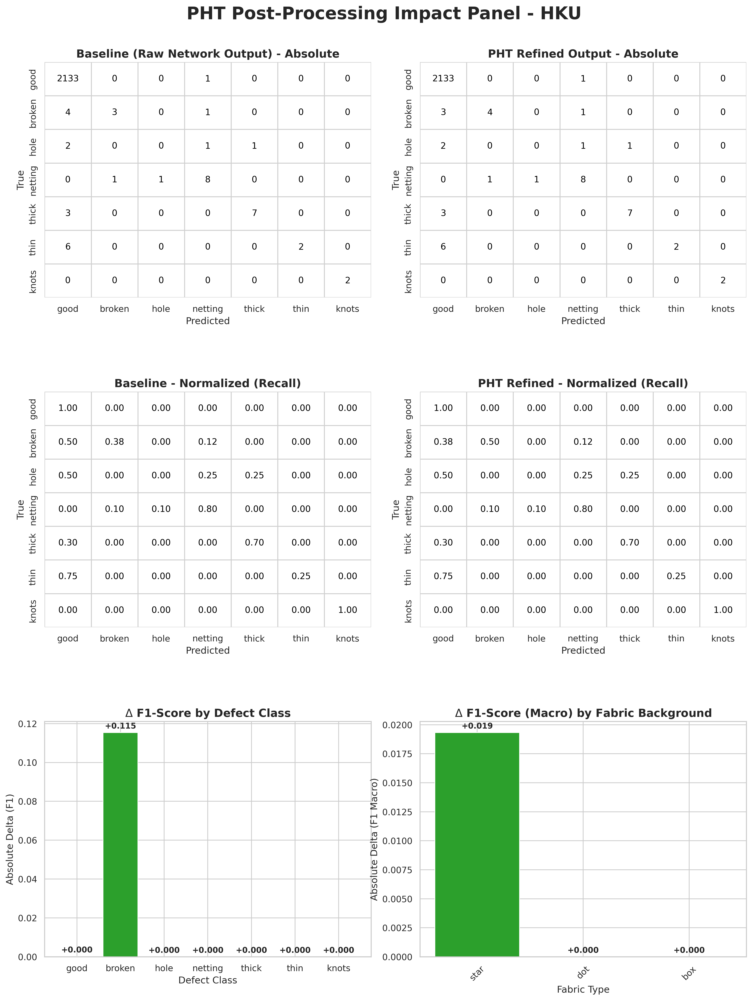

In [18]:
report_hku = run_phase3_report(df=df_hku, 
                               dataset_name=CONFIGS["HKU"]["name"],
                               pixel_masks=pixel_masks_hku)
fab_report_hku = run_fabric_accuracy_report(df_hku)

plot_path = generate_analytical_plots(
    df=df_hku, 
    dataset_name=CONFIGS["HKU"]["name"],
    plain_cm=True,
    class_names=CONFIGS["HKU"]["class_names"]
)

display(Image.open(plot_path))

## HKU FULL TEST

In [19]:
# report_hku_full = run_phase3_report(df=df_hku_full, 
#                                dataset_name=CONFIGS["HKU"]["name"],
#                                pixel_masks=pixel_masks_hku_full)
# fab_report_hku = run_fabric_accuracy_report(df_hku)

# plot_path = generate_analytical_plots(
#     df=df_hku_full, 
#     dataset_name=CONFIGS["HKU"]["name"],
#     plain_cm=True,
#     class_names=CONFIGS["HKU"]["class_names"]
# )

# display(Image.open(plot_path))

## TILDA TEST 

[2026-08-17 05:59:59] [INFO] === PHASE 3: METRICS REPORTING | TILDA ===
[2026-08-17 06:00:00] [INFO] Performance Summary (7680 total patches evaluated):
[2026-08-17 06:00:00] [INFO]                   Baseline (Raw) PHT (Refined) Delta (PHT - Base)
[2026-08-17 06:00:00] [INFO] Bin_Acc                   0.9842        0.9846             0.0004
[2026-08-17 06:00:00] [INFO] Bin_Precision             0.8981        0.8869            -0.0112
[2026-08-17 06:00:00] [INFO] Bin_Recall                0.7601        0.7817             0.0216
[2026-08-17 06:00:00] [INFO] Bin_F1                    0.8234        0.8309             0.0076
[2026-08-17 06:00:00] [INFO] Multi_Acc                 0.9832        0.9840             0.0008
[2026-08-17 06:00:00] [INFO] Multi_F1_Macro            0.8324        0.8477             0.0153
[2026-08-17 06:00:00] [INFO] Multi_F1_Weighted         0.9825        0.9835             0.0010
[2026-08-17 06:00:00] [INFO] Patch_IoU                 0.6998        0.7108            

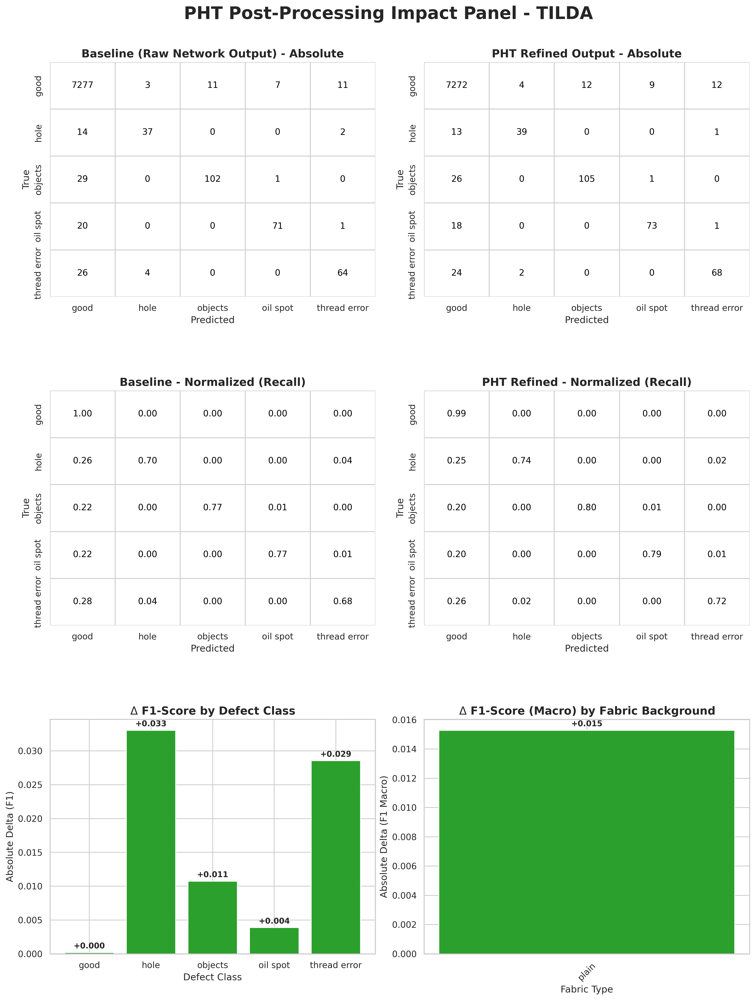

In [20]:
report_tilda = run_phase3_report(df=df_tilda, 
                               dataset_name=CONFIGS["TILDA"]["name"],
                               pixel_masks=pixel_masks_tilda)
fab_report_tilda = run_fabric_accuracy_report(df_tilda)

plot_path = generate_analytical_plots(
    df=df_tilda, 
    dataset_name=CONFIGS["TILDA"]["name"],
    plain_cm=True,
    class_names=CONFIGS["TILDA"]["class_names"]
)

display(Image.open(plot_path))

In [21]:
def run_phase4_bootstrapping(
    df: pd.DataFrame,
    dataset_name: str,
    n_iterations: int = 1000,
    seed: int = 42,
    output_dir: str = "/kaggle/working/experiments"
) -> tuple[pd.DataFrame, dict]:
    """
    Executes a paired cluster bootstrap over source images (group_id/img_id) to calculate
    95% percentile confidence intervals for post-processing metric shifts (Delta = PHT - Baseline).

    NOTE: These confidence intervals quantify dataset sampling uncertainty conditional 
    on the single fitted model checkpoint. They do not quantify training stochasticity across seeds.
    """
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info(f"=== PHASE 4: PAIRED CLUSTER BOOTSTRAPPING (N={n_iterations}) | {dataset_name.upper()} ===")

    # 1. Dynamic Schema Resolution
    group_col = 'group_id' if 'group_id' in df.columns else 'img_id'
    if group_col not in df.columns:
        raise KeyError(f"Missing image grouping column. Expected 'group_id' or 'img_id'. Found: {list(df.columns)}")

    rng = np.random.default_rng(seed)
    unique_groups = df[group_col].unique()
    sys_logger.info(f"Identified {len(unique_groups)} source image clusters across {len(df)} patches.")

    # 2. Pre-cache Image-Level Arrays for Fast Vectorized Resampling
    group_dict = {}
    for g_id, g_df in df.groupby(group_col, observed=False):
        group_dict[g_id] = {
            'y_t_m': g_df['y_multi'].values.astype(int),
            'y_b_m': g_df['pred_raw_multi'].values.astype(int),
            'y_p_m': g_df['pred_pht_multi'].values.astype(int),
            'y_t_b': g_df['y_binary'].values.astype(int),
            'y_b_b': g_df['pred_raw_binary'].values.astype(int),
            'y_p_b': g_df['pred_pht_binary'].values.astype(int),
        }

    deltas = {
        'Binary_Acc': np.zeros(n_iterations),
        'Macro_F1': np.zeros(n_iterations),
        'Patch_IoU': np.zeros(n_iterations),
        'Patch_Dice': np.zeros(n_iterations)
    }

    sys_logger.info(f"Resampling image clusters with replacement (Seed: {seed})...")

    # 3. Paired Resampling Loop
    for i in tqdm(range(n_iterations), desc=f"Bootstrapping ({dataset_name.upper()})", leave=False):
        sampled_groups = rng.choice(unique_groups, size=len(unique_groups), replace=True)

        # Concatenate patch arrays for drawn clusters
        y_t_m = np.concatenate([group_dict[g]['y_t_m'] for g in sampled_groups])
        y_b_m = np.concatenate([group_dict[g]['y_b_m'] for g in sampled_groups])
        y_p_m = np.concatenate([group_dict[g]['y_p_m'] for g in sampled_groups])

        y_t_b = np.concatenate([group_dict[g]['y_t_b'] for g in sampled_groups])
        y_b_b = np.concatenate([group_dict[g]['y_b_b'] for g in sampled_groups])
        y_p_b = np.concatenate([group_dict[g]['y_p_b'] for g in sampled_groups])

        # Baseline Metrics
        b_acc = accuracy_score(y_t_b, y_b_b)
        b_f1_mac = f1_score(y_t_m, y_b_m, average='macro', zero_division=0)
        b_tp = np.logical_and(y_t_b == 1, y_b_b == 1).sum()
        b_fp = np.logical_and(y_t_b == 0, y_b_b == 1).sum()
        b_fn = np.logical_and(y_t_b == 1, y_b_b == 0).sum()

        b_iou = b_tp / (b_tp + b_fp + b_fn) if (b_tp + b_fp + b_fn) > 0 else 0.0
        b_dice = (2 * b_tp) / (2 * b_tp + b_fp + b_fn) if (2 * b_tp + b_fp + b_fn) > 0 else 0.0

        # PHT Refined Metrics
        p_acc = accuracy_score(y_t_b, y_p_b)
        p_f1_mac = f1_score(y_t_m, y_p_m, average='macro', zero_division=0)
        p_tp = np.logical_and(y_t_b == 1, y_p_b == 1).sum()
        p_fp = np.logical_and(y_t_b == 0, y_p_b == 1).sum()
        p_fn = np.logical_and(y_t_b == 1, y_p_b == 0).sum()

        p_iou = p_tp / (p_tp + p_fp + p_fn) if (p_tp + p_fp + p_fn) > 0 else 0.0
        p_dice = (2 * p_tp) / (2 * p_tp + p_fp + p_fn) if (2 * p_tp + p_fp + p_fn) > 0 else 0.0

        # Paired Deltas (in percentage points)
        deltas['Binary_Acc'][i] = (p_acc - b_acc) * 100.0
        deltas['Macro_F1'][i] = (p_f1_mac - b_f1_mac) * 100.0
        deltas['Patch_IoU'][i] = (p_iou - b_iou) * 100.0
        deltas['Patch_Dice'][i] = (p_dice - b_dice) * 100.0

    # 4. Statistical Summary
    results = []
    for kpi, d_array in deltas.items():
        mean_delta = np.mean(d_array)
        ci_lower = np.percentile(d_array, 2.5)
        ci_upper = np.percentile(d_array, 97.5)

        if ci_lower > 0:
            shift_status = "Positive Shift (CI > 0)"
        elif ci_upper < 0:
            shift_status = "Negative Shift (CI < 0)"
        else:
            shift_status = "Inconclusive Shift (CI spans 0)"

        results.append({
            'Metric': kpi,
            'Mean Delta (pp)': mean_delta,
            '95% CI Lower': ci_lower,
            '95% CI Upper': ci_upper,
            'Interval Status': shift_status
        })

    df_stats = pd.DataFrame(results)

    sys_logger.info("Evaluation Uncertainty Summary (Metric Deltas in percentage points):")
    display_df = df_stats.copy()
    for col in ['Mean Delta (pp)', '95% CI Lower', '95% CI Upper']:
        display_df[col] = display_df[col].apply(lambda x: f"{x:+.2f}")

    for line in display_df.to_string(index=False).split('\n'):
        sys_logger.info(line)

    return df_stats, deltas

In [22]:
stats_hku, deltas_dist_hku = run_phase4_bootstrapping(df_hku, CONFIGS["HKU"]["name"])

[2026-08-17 06:00:04] [INFO] === PHASE 4: PAIRED CLUSTER BOOTSTRAPPING (N=1000) | HKU ===
[2026-08-17 06:00:04] [INFO] Identified 34 source image clusters across 2176 patches.
[2026-08-17 06:00:04] [INFO] Resampling image clusters with replacement (Seed: 42)...


[2026-08-17 06:00:08] [INFO] Evaluation Uncertainty Summary (Metric Deltas in percentage points):
[2026-08-17 06:00:08] [INFO]     Metric Mean Delta (pp) 95% CI Lower 95% CI Upper                 Interval Status
[2026-08-17 06:00:08] [INFO] Binary_Acc           +0.04        +0.00        +0.14 Inconclusive Shift (CI spans 0)
[2026-08-17 06:00:08] [INFO]   Macro_F1           +1.48        +0.00        +4.20 Inconclusive Shift (CI spans 0)
[2026-08-17 06:00:08] [INFO]  Patch_IoU           +2.23        +0.00        +7.50 Inconclusive Shift (CI spans 0)
[2026-08-17 06:00:08] [INFO] Patch_Dice           +1.74        +0.00        +6.13 Inconclusive Shift (CI spans 0)


In [23]:
# stats_hku_full, deltas_dist_hku_full = run_phase4_bootstrapping(df_hku_full, CONFIGS["HKU"]["name"])

In [24]:
stats_tilda, deltas_dist_tilda = run_phase4_bootstrapping(df_tilda, CONFIGS["TILDA"]["name"])

[2026-08-17 06:00:08] [INFO] === PHASE 4: PAIRED CLUSTER BOOTSTRAPPING (N=1000) | TILDA ===
[2026-08-17 06:00:08] [INFO] Identified 80 source image clusters across 7680 patches.
[2026-08-17 06:00:08] [INFO] Resampling image clusters with replacement (Seed: 42)...


[2026-08-17 06:00:14] [INFO] Evaluation Uncertainty Summary (Metric Deltas in percentage points):
[2026-08-17 06:00:14] [INFO]     Metric Mean Delta (pp) 95% CI Lower 95% CI Upper                 Interval Status
[2026-08-17 06:00:14] [INFO] Binary_Acc           +0.04        -0.08        +0.16 Inconclusive Shift (CI spans 0)
[2026-08-17 06:00:14] [INFO]   Macro_F1           +1.53        +0.18        +2.83         Positive Shift (CI > 0)
[2026-08-17 06:00:14] [INFO]  Patch_IoU           +1.09        -0.72        +2.91 Inconclusive Shift (CI spans 0)
[2026-08-17 06:00:14] [INFO] Patch_Dice           +0.75        -0.49        +2.01 Inconclusive Shift (CI spans 0)


In [25]:
def prepare_spatial_cache_from_grid(
    logits_grid: torch.Tensor, 
    device: torch.device
) -> List[Dict[str, Any]]:
    """
    Constructs spatial cache structures natively on the GPU directly from a 
    [H, W, C] logits tensor. Upcasts to float32 to enforce numerical stability
    and maintain dtype consistency across post-processing operations.
    """
    # 1. Cast logits to float32 before softmax calculation
    probs_grid = torch.softmax(logits_grid.float(), dim=-1)
    
    H, W, num_classes = probs_grid.shape

    # 2. Generate 2D spatial coordinate indices natively on GPU
    rows, cols = torch.meshgrid(
        torch.arange(H, device=device, dtype=torch.long),
        torch.arange(W, device=device, dtype=torch.long),
        indexing='ij'
    )

    row_tensor = rows.reshape(-1)
    col_tensor = cols.reshape(-1)
    indices_tensor = torch.arange(H * W, device=device, dtype=torch.long)

    return [{
        'probs_grid': probs_grid,
        'row_tensor': row_tensor,
        'col_tensor': col_tensor,
        'indices_tensor': indices_tensor
    }]

# import os
# import torch
# import numpy as np
# import pandas as pd
# import torchvision.transforms.functional as TF
# from typing import Tuple, Optional

# def build_image_mosaic_buffer(
#     df: pd.DataFrame,
#     patch_dataset,
#     target_defect_ratio: float,
#     buffer_shape: Tuple[int, int] = (10240, 2048),
#     patch_size: int = 64,
#     src_img_patches_shape: Optional[Tuple[int, int]] = None,
#     save_preview_path: Optional[str] = None
# ) -> torch.Tensor:
#     """
#     Assembles a full-frame mosaic by tiling whole source images into a 2D grid,
#     cropping boundary overflow to guarantee an exact target buffer resolution.
#     """
#     # 0. Auto-instantiate dataset if path string is provided
#     if isinstance(patch_dataset, str):
#         patch_dataset = TextileDataset(
#             dev_set_path=patch_dataset,
#             indices=None,
#             transform=None,
#             in_memory=False
#         )

#     buffer_h, buffer_w = buffer_shape
#     buf_h_patches = buffer_h // patch_size
#     buf_w_patches = buffer_w // patch_size

#     # 1. Inspect source image dimensions and enforce strict uniformity across all images
#     image_stats = df.groupby('img_id').agg(
#         total_patches=('patch_idx', 'count'),
#         defect_patches=('y_multi', lambda x: (x > 0).sum())
#     ).reset_index()

#     unique_patch_counts = image_stats['total_patches'].unique()
#     if len(unique_patch_counts) > 1:
#         raise ValueError(
#             f"Inconsistent source image resolutions detected in metadata: {unique_patch_counts}. "
#             f"All source images must have identical patch counts."
#         )
#     img_total_patches = int(unique_patch_counts[0])

#     # 2. Determine or infer per-image spatial grid dimensions (H_patches, W_patches)
#     if src_img_patches_shape is not None:
#         img_h_patches, img_w_patches = src_img_patches_shape
#         if img_h_patches * img_w_patches != img_total_patches:
#             raise ValueError(
#                 f"Provided src_img_patches_shape ({img_h_patches}x{img_w_patches}={img_h_patches*img_w_patches}) "
#                 f"does not match metadata patch count per image ({img_total_patches})."
#             )
#     else:
#         coord_cols = [c for c in ['patch_row', 'row', 'grid_row'] if c in df.columns]
#         col_cols = [c for c in ['patch_col', 'col', 'grid_col'] if c in df.columns]
        
#         if coord_cols and col_cols:
#             img_h_patches = int(df[coord_cols[0]].max() + 1)
#             img_w_patches = int(df[col_cols[0]].max() + 1)
#         else:
#             raise ValueError(
#                 f"Unable to infer 2D grid shape for source images (total patches: {img_total_patches}). "
#                 f"Please pass `src_img_patches_shape=(h_patches, w_patches)` explicitly."
#             )

#     # 3. Calculate ceiling number of whole image tiles required to cover or exceed target buffer
#     n_img_rows = (buf_h_patches + img_h_patches - 1) // img_h_patches
#     n_img_cols = (buf_w_patches + img_w_patches - 1) // img_w_patches
#     total_required_images = n_img_rows * n_img_cols

#     # 4. Bin source images by defect severity
#     image_stats['defect_ratio'] = image_stats['defect_patches'] / image_stats['total_patches']
#     if target_defect_ratio == 0.0:
#         candidate_images = image_stats[image_stats['defect_ratio'] == 0.0]['img_id'].values
#     elif target_defect_ratio < 0.15:
#         candidate_images = image_stats[(image_stats['defect_ratio'] > 0.0) & (image_stats['defect_ratio'] <= 0.15)]['img_id'].values
#     else:
#         candidate_images = image_stats[image_stats['defect_ratio'] > 0.15]['img_id'].values

#     if len(candidate_images) == 0:
#         candidate_images = image_stats['img_id'].values

#     # 5. Sample whole images (with replacement) to populate the tiling grid
#     selected_img_ids = np.random.choice(candidate_images, size=total_required_images, replace=True)

#     # 6. Load and assemble 2D patch grids for each sampled whole image
#     image_grid_list = []
#     sort_key = coord_cols[0] if 'coord_cols' in locals() and coord_cols else 'patch_idx'

#     for row_idx in range(n_img_rows):
#         row_images = []
#         for col_idx in range(n_img_cols):
#             img_id = selected_img_ids[row_idx * n_img_cols + col_idx]
            
#             img_df = df[df['img_id'] == img_id].sort_values(sort_key)
#             patch_indices = img_df['patch_idx'].values
            
#             if len(patch_indices) != img_total_patches:
#                 raise ValueError(
#                     f"Image ID '{img_id}' contains {len(patch_indices)} patches, expected {img_total_patches}."
#                 )

#             patches = [
#                 patch_dataset[int(idx)][0] if isinstance(patch_dataset[int(idx)], (tuple, list)) 
#                 else patch_dataset[int(idx)]
#                 for idx in patch_indices
#             ]
            
#             img_tensor = torch.stack(patches).view(img_h_patches, img_w_patches, 3, patch_size, patch_size)
#             row_images.append(img_tensor)
        
#         image_grid_list.append(torch.stack(row_images))

#     # 7. Stack into 6D grid tensor: [N_rows, N_cols, H_img_patches, W_img_patches, C, P_h, P_w]
#     full_grid = torch.stack(image_grid_list)

#     # 8. Collapse dimensions into an uncropped frame tensor
#     uncropped_h = n_img_rows * img_h_patches * patch_size
#     uncropped_w = n_img_cols * img_w_patches * patch_size
#     raw_buffer = full_grid.permute(4, 0, 2, 5, 1, 3, 6).contiguous().view(3, uncropped_h, uncropped_w)

#     # 9. Crop spatial overflow to return the exact requested buffer shape
#     buffer = raw_buffer[:, :buffer_h, :buffer_w].contiguous()

#     # 10. Export preview
#     if save_preview_path:
#         os.makedirs(os.path.dirname(save_preview_path), exist_ok=True)
#         preview_h, preview_w = buffer_h // 2, buffer_w // 2
#         preview_tensor = torch.nn.functional.interpolate(
#             buffer.unsqueeze(0), size=(preview_h, preview_w), mode='bilinear', align_corners=False
#         ).squeeze(0)
        
#         preview_img = TF.to_pil_image((preview_tensor.clamp(0, 1) * 255).byte())
#         preview_img.save(save_preview_path, format="PNG")

#     return buffer

# def run_pipeline_speed_benchmark(
#     model_path: str,
#     df: pd.DataFrame,
#     patch_dataset,
#     patch_size: int = 64,
#     image_height: int = 10240,
#     image_width: int = 2048,
#     tau_1: float = 0.38,
#     tau_2: float = 0.21,
#     num_runs: int = 200,
#     warmup_runs: int = 100,
#     inference_batch_size: int = 256,
#     use_fp16: bool = True,
#     use_compile: bool = True,
#     output_dir: str = "/kaggle/working/experiments"
# ) -> dict:
#     """
#     Executes an industrial line-scan throughput benchmark with sys_logger integration,
#     pinned host-memory transfers, and spatial-continuity mosaic buffers.
#     """
#     sys_logger = setup_logger(output_dir=output_dir)
#     sys_logger.info("=== PHASE 5: PIPELINE THROUGHPUT BENCHMARK ===")

#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     if device.type != 'cuda':
#         raise RuntimeError("Benchmark requires an active CUDA GPU for high-precision event timing.")

#     gpu_name = torch.cuda.get_device_name(0)
#     sys_logger.info(f"Execution Target Hardware: {gpu_name}")

#     # 1. Model Checkpoint Loading & Optimization
#     model = LightningModel.load_from_checkpoint(
#         model_path, map_location=device, strict=False
#     )
#     model.eval()

#     model_name = getattr(model.hparams, 'model_name', 'Unknown')
#     num_classes = getattr(model.hparams, 'num_classes', 7)
#     sys_logger.info(f"Loaded Checkpoint Model: {model_name} | Classes: {num_classes}")

#     if use_fp16:
#         model = model.half()

#     if use_compile:
#         sys_logger.info("Applying torch.compile(mode='reduce-overhead')...")
#         model = torch.compile(model, mode="reduce-overhead")

#     torch.backends.cudnn.benchmark = True

#     # 2. Benchmark Workload Scenarios
#     scenarios = {
#         "Clean (0% Defect)": 0.0,
#         "Nominal (5% Defect)": 0.05,
#         "Stress (25% Defect)": 0.25
#     }

#     n_patches_h = image_height // patch_size
#     n_patches_w = image_width // patch_size
#     total_patches = n_patches_h * n_patches_w

#     results = {}

#     start_transfer = torch.cuda.Event(enable_timing=True)
#     end_transfer = torch.cuda.Event(enable_timing=True)
#     start_pre = torch.cuda.Event(enable_timing=True)
#     end_pre = torch.cuda.Event(enable_timing=True)
#     start_inf = torch.cuda.Event(enable_timing=True)
#     end_inf = torch.cuda.Event(enable_timing=True)
#     start_post = torch.cuda.Event(enable_timing=True)
#     end_post = torch.cuda.Event(enable_timing=True)

#     # 3. Scenario Execution Loop
#     for scenario_name, defect_ratio in scenarios.items():
#         sys_logger.info(f"Evaluating Scenario Workload: {scenario_name}")
        
#         preview_filename = scenario_name.split()[0].lower() + "_preview.jpg"
#         preview_path = os.path.join(output_dir, "previews", preview_filename)

#         # Assemble CPU mosaic buffer
#         cpu_buffer = build_image_mosaic_buffer(
#             df=df,
#             patch_dataset=patch_dataset,
#             target_defect_ratio=defect_ratio,
#             buffer_shape=(image_height, image_width),
#             patch_size=patch_size,
#             save_preview_path=preview_path
#         )
#         if use_fp16:
#             cpu_buffer = cpu_buffer.half()

#         # Pin CPU buffer memory to enable non-blocking async CUDA transfer
#         cpu_buffer = cpu_buffer.pin_memory()

#         t_transfer_list, t_pre_list, t_inf_list, t_post_list, t_total_list = [], [], [], [], []

#         for run in range(warmup_runs + num_runs):
#             is_warmup = run < warmup_runs

#             # Step A: Asynchronous CPU to GPU Memory Transfer
#             start_transfer.record()
#             gpu_image = cpu_buffer.to(device, non_blocking=True)
#             end_transfer.record()

#             # Step B: GPU Spatial Unfolding / Preprocessing
#             start_pre.record()
#             patches = gpu_image.unfold(1, patch_size, patch_size)\
#                                .unfold(2, patch_size, patch_size)\
#                                .permute(1, 2, 0, 3, 4)\
#                                .reshape(-1, 3, patch_size, patch_size)
#             end_pre.record()

#             # Step C: Model Batched Forward Pass
#             start_inf.record()
#             with torch.inference_mode():
#                 if total_patches <= inference_batch_size:
#                     logits = model(patches)
#                 else:
#                     logits = torch.empty(
#                         (total_patches, num_classes),
#                         dtype=torch.float16 if use_fp16 else torch.float32,
#                         device=device
#                     )
#                     for i in range(0, total_patches, inference_batch_size):
#                         end = min(i + inference_batch_size, total_patches)
#                         logits[i:end] = model(patches[i:end])
#             end_inf.record()

#             # Step D: GPU PHT Post-Processing Execution
#             start_post.record()
#             logits_grid = logits.view(n_patches_h, n_patches_w, -1)
            
#             # Pure PyTorch CUDA transformation (No Pandas / No CPU sync)
#             spatial_cache = prepare_spatial_cache_from_grid(logits_grid, device=device)
#             pht_map = apply_postprocessing_fast(spatial_cache, total_patches, tau_1, tau_2, METHOD, STRUCT_ELEM)
            
#             end_post.record()

#             torch.cuda.synchronize()

#             if not is_warmup:
#                 t_trans = start_transfer.elapsed_time(end_transfer)
#                 t_pre = start_pre.elapsed_time(end_pre)
#                 t_inf = start_inf.elapsed_time(end_inf)
#                 t_post = start_post.elapsed_time(end_post)
                
#                 t_transfer_list.append(t_trans)
#                 t_pre_list.append(t_pre)
#                 t_inf_list.append(t_inf)
#                 t_post_list.append(t_post)
#                 t_total_list.append(t_trans + t_pre + t_inf + t_post)

#         results[scenario_name] = {
#             "transfer_ms": (np.mean(t_transfer_list), np.std(t_transfer_list)),
#             "pre_ms": (np.mean(t_pre_list), np.std(t_pre_list)),
#             "inf_ms": (np.mean(t_inf_list), np.std(t_inf_list)),
#             "post_ms": (np.mean(t_post_list), np.std(t_post_list)),
#             "total_ms": (np.mean(t_total_list), np.std(t_total_list)),
#             "fps": 1000.0 / np.mean(t_total_list)
#         }

#     # 4. Formatted Execution Summary Output via sys_logger
#     sys_logger.info("=" * 105)
#     sys_logger.info(f"{'Scenario':<22} | {'H2D Transfer (ms)':<18} | {'Preprocess (ms)':<18} | {'Inference (ms)':<16} | {'GPU PHT (ms)':<14} | {'Total Latency (ms)':<18} | {'FPS'}")
#     sys_logger.info("=" * 105)
#     for name, data in results.items():
#         sys_logger.info(
#             f"{name:<22} | "
#             f"{data['transfer_ms'][0]:.2f} ± {data['transfer_ms'][1]:.2f} ms | "
#             f"{data['pre_ms'][0]:.2f} ± {data['pre_ms'][1]:.2f} ms | "
#             f"{data['inf_ms'][0]:.2f} ± {data['inf_ms'][1]:.2f} ms | "
#             f"{data['post_ms'][0]:.2f} ± {data['post_ms'][1]:.2f} ms | "
#             f"{data['total_ms'][0]:.2f} ± {data['total_ms'][1]:.2f} ms | "
#             f"{data['fps']:.1f}"
#         )
#     sys_logger.info("=" * 105)

#     return results

In [26]:
import os
from typing import Tuple, Dict, List, Optional
import numpy as np
import pandas as pd
import torch
import torchvision.transforms.functional as TF

def build_source_image_cache(
    df: pd.DataFrame,
    patch_dataset,
    patch_size: int = 64,
    src_img_patches_shape: Optional[Tuple[int, int]] = None
) -> Tuple[Dict[str, torch.Tensor], pd.DataFrame, Tuple[int, int]]:
    """
    Pre-assembles unique source images into contiguous 3D Tensors (C, H_img, W_img).
    Executes once during setup to eliminate Pandas and Dataset indexing overhead during benchmarking.
    """
    if isinstance(patch_dataset, str):
        patch_dataset = TextileDataset(
            dev_set_path=patch_dataset,
            indices=None,
            transform=None,
            in_memory=False
        )

    # 1. Validate patch uniformity and compute defect ratios
    image_stats = df.groupby('img_id').agg(
        total_patches=('patch_idx', 'count'),
        defect_patches=('y_multi', lambda x: (x > 0).sum())
    ).reset_index()

    unique_patch_counts = image_stats['total_patches'].unique()
    if len(unique_patch_counts) > 1:
        raise ValueError(f"Inconsistent source image resolutions detected: {unique_patch_counts}")
    img_total_patches = int(unique_patch_counts[0])

    # 2. Determine spatial dimensions
    if src_img_patches_shape is not None:
        img_h_patches, img_w_patches = src_img_patches_shape
    else:
        coord_cols = [c for c in ['patch_row', 'row', 'grid_row'] if c in df.columns]
        col_cols = [c for c in ['patch_col', 'col', 'grid_col'] if c in df.columns]
        if coord_cols and col_cols:
            img_h_patches = int(df[coord_cols[0]].max() + 1)
            img_w_patches = int(df[col_cols[0]].max() + 1)
        else:
            raise ValueError("Unable to infer 2D grid shape for source images.")

    image_stats['defect_ratio'] = image_stats['defect_patches'] / image_stats['total_patches']
    sort_key = coord_cols[0] if 'coord_cols' in locals() and coord_cols else 'patch_idx'

    # 3. Cache full spatial image tensors
    image_cache = {}
    for img_id in image_stats['img_id'].values:
        img_df = df[df['img_id'] == img_id].sort_values(sort_key)
        patch_indices = img_df['patch_idx'].values

        patches = [
            patch_dataset[int(idx)][0] if isinstance(patch_dataset[int(idx)], (tuple, list))
            else patch_dataset[int(idx)]
            for idx in patch_indices
        ]

        # Reshape stacked patches [N, C, P, P] into full 2D spatial image [C, H_px, W_px]
        img_grid = torch.stack(patches).view(img_h_patches, img_w_patches, 3, patch_size, patch_size)
        full_img = img_grid.permute(2, 0, 3, 1, 4).contiguous().view(
            3, img_h_patches * patch_size, img_w_patches * patch_size
        )
        image_cache[img_id] = full_img

    return image_cache, image_stats, (img_h_patches, img_w_patches)


def update_mosaic_buffer_in_place(
    buffer: torch.Tensor,
    candidate_tensors: List[torch.Tensor],
    img_h_px: int,
    img_w_px: int,
    n_img_rows: int,
    n_img_cols: int,
    buffer_h: int,
    buffer_w: int
) -> None:
    """
    Overwrites a pre-allocated host pinned memory buffer in-place using fast vector copies.
    """
    selected_indices = np.random.choice(len(candidate_tensors), size=n_img_rows * n_img_cols, replace=True)

    for r in range(n_img_rows):
        for c in range(n_img_cols):
            src_img = candidate_tensors[selected_indices[r * n_img_cols + c]]

            h_start, h_end = r * img_h_px, min((r + 1) * img_h_px, buffer_h)
            w_start, w_end = c * img_w_px, min((c + 1) * img_w_px, buffer_w)

            slice_h = h_end - h_start
            slice_w = w_end - w_start

            buffer[:, h_start:h_end, w_start:w_end].copy_(src_img[:, :slice_h, :slice_w])


def run_pipeline_speed_benchmark(
    model_path: str,
    df: pd.DataFrame,
    patch_dataset,
    patch_size: int = 64,
    image_height: int = 10240,
    image_width: int = 2048,
    tau_1: float = 0.38,
    tau_2: float = 0.21,
    num_runs: int = 200,
    warmup_runs: int = 100,
    inference_batch_size: int = 256,
    use_fp16: bool = True,
    use_compile: bool = True,
    output_dir: str = "/kaggle/working/experiments"
) -> dict:
    sys_logger = setup_logger(output_dir=output_dir)
    sys_logger.info("=== PHASE 5: PIPELINE THROUGHPUT BENCHMARK ===")

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    if device.type != 'cuda':
        raise RuntimeError("Benchmark requires an active CUDA GPU for high-precision event timing.")

    # 1. Pre-build Image Cache (executed ONCE)
    sys_logger.info("Pre-assembling image cache for fast multi-mosaic generation...")
    image_cache, image_stats, (img_h_p, img_w_p) = build_source_image_cache(
        df=df, patch_dataset=patch_dataset, patch_size=patch_size
    )

    img_h_px, img_w_px = img_h_p * patch_size, img_w_p * patch_size
    buf_h_patches, buf_w_patches = image_height // patch_size, image_width // patch_size
    n_img_rows = (buf_h_patches + img_h_p - 1) // img_h_p
    n_img_cols = (buf_w_patches + img_w_p - 1) // img_w_p
    total_patches = buf_h_patches * buf_w_patches

    # 2. Pre-allocate Pinned Host Memory Buffer
    pinned_buffer = torch.empty(
        (3, image_height, image_width),
        dtype=torch.float16 if use_fp16 else torch.float32
    ).pin_memory()

    # 3. Model Checkpoint Loading
    model = LightningModel.load_from_checkpoint(model_path, map_location=device, strict=False)
    model.eval()

    if use_fp16:
        model = model.half()
    if use_compile:
        model = torch.compile(model, mode="reduce-overhead")

    torch.backends.cudnn.benchmark = True

    scenarios = {
        "Clean (0% Defect)": 0.0,
        "Nominal (5% Defect)": 0.05,
        "Stress (25% Defect)": 0.25
    }

    results = {}

    start_transfer, end_transfer = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)
    start_pre, end_pre = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)
    start_inf, end_inf = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)
    start_post, end_post = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)

    for scenario_name, defect_ratio in scenarios.items():
        sys_logger.info(f"Evaluating Scenario Workload: {scenario_name}")

        # Filter candidate pool for current scenario
        if defect_ratio == 0.0:
            c_ids = image_stats[image_stats['defect_ratio'] == 0.0]['img_id'].values
        elif defect_ratio < 0.15:
            c_ids = image_stats[(image_stats['defect_ratio'] > 0.0) & (image_stats['defect_ratio'] <= 0.15)]['img_id'].values
        else:
            c_ids = image_stats[image_stats['defect_ratio'] > 0.15]['img_id'].values

        if len(c_ids) == 0:
            c_ids = image_stats['img_id'].values

        candidate_tensors = [
            image_cache[id_].half() if use_fp16 else image_cache[id_]
            for id_ in c_ids
        ]

        t_transfer_list, t_pre_list, t_inf_list, t_post_list, t_total_list = [], [], [], [], []

        for run in range(warmup_runs + num_runs):
            is_warmup = run < warmup_runs

            # Step 0: Assemble a NEW distinct high-res mosaic in-place into pinned memory
            update_mosaic_buffer_in_place(
                buffer=pinned_buffer,
                candidate_tensors=candidate_tensors,
                img_h_px=img_h_px,
                img_w_px=img_w_px,
                n_img_rows=n_img_rows,
                n_img_cols=n_img_cols,
                buffer_h=image_height,
                buffer_w=image_width
            )

            # Step A: Async Host-to-Device CUDA Transfer
            start_transfer.record()
            gpu_image = pinned_buffer.to(device, non_blocking=True)
            end_transfer.record()

            # Step B: Spatial Unfolding
            start_pre.record()
            patches = gpu_image.unfold(1, patch_size, patch_size)\
                               .unfold(2, patch_size, patch_size)\
                               .permute(1, 2, 0, 3, 4)\
                               .reshape(-1, 3, patch_size, patch_size)
            end_pre.record()

            # Step C: Inference Pass
            start_inf.record()
            with torch.inference_mode():
                if total_patches <= inference_batch_size:
                    logits = model(patches)
                else:
                    logits = torch.empty(
                        (total_patches, model.hparams.num_classes),
                        dtype=torch.float16 if use_fp16 else torch.float32,
                        device=device
                    )
                    for i in range(0, total_patches, inference_batch_size):
                        end = min(i + inference_batch_size, total_patches)
                        logits[i:end] = model(patches[i:end])
            end_inf.record()

            # Step D: Post-Processing
            start_post.record()
            logits_grid = logits.view(buf_h_patches, buf_w_patches, -1)
            spatial_cache = prepare_spatial_cache_from_grid(logits_grid, device=device)
            pht_map = apply_postprocessing_fast(spatial_cache, total_patches, tau_1, tau_2, METHOD, STRUCT_ELEM)
            end_post.record()

            torch.cuda.synchronize()

            if not is_warmup:
                t_trans = start_transfer.elapsed_time(end_transfer)
                t_pre = start_pre.elapsed_time(end_pre)
                t_inf = start_inf.elapsed_time(end_inf)
                t_post = start_post.elapsed_time(end_post)

                t_transfer_list.append(t_trans)
                t_pre_list.append(t_pre)
                t_inf_list.append(t_inf)
                t_post_list.append(t_post)
                t_total_list.append(t_trans + t_pre + t_inf + t_post)

        results[scenario_name] = {
            "transfer_ms": (np.mean(t_transfer_list), np.std(t_transfer_list)),
            "pre_ms": (np.mean(t_pre_list), np.std(t_pre_list)),
            "inf_ms": (np.mean(t_inf_list), np.std(t_inf_list)),
            "post_ms": (np.mean(t_post_list), np.std(t_post_list)),
            "total_ms": (np.mean(t_total_list), np.std(t_total_list)),
            "fps": 1000.0 / np.mean(t_total_list)
        }

    # 4. Formatted Execution Summary Output via sys_logger
    sys_logger.info("=" * 105)
    sys_logger.info(
        f"{'Scenario':<22} | {'H2D Transfer (ms)':<18} | {'Preprocess (ms)':<18} | "
        f"{'Inference (ms)':<16} | {'GPU PHT (ms)':<14} | {'Total Latency (ms)':<18} | {'FPS'}"
    )
    sys_logger.info("=" * 105)
    for name, data in results.items():
        sys_logger.info(
            f"{name:<22} | "
            f"{data['transfer_ms'][0]:.2f} ± {data['transfer_ms'][1]:.2f} ms | "
            f"{data['pre_ms'][0]:.2f} ± {data['pre_ms'][1]:.2f} ms | "
            f"{data['inf_ms'][0]:.2f} ± {data['inf_ms'][1]:.2f} ms | "
            f"{data['post_ms'][0]:.2f} ± {data['post_ms'][1]:.2f} ms | "
            f"{data['total_ms'][0]:.2f} ± {data['total_ms'][1]:.2f} ms | "
            f"{data['fps']:.1f}"
        )
    sys_logger.info("=" * 105)

    return results

In [27]:
# CONFIG_BENCHMARK = {
#     "model_path": CONFIGS["HKU"]["model_ckpt"],
#     "df": df_hku,
#     "patch_dataset": CONFIGS["HKU"]["test_set_path"],
#     "patch_size": CONFIGS["HKU"]["patch_size"],                          
#     "image_height": 2048,                        
#     "image_width": 10240,                        
#     "tau_1": 0.25,                     
#     "tau_2": 0.24,                                
#     "num_runs": 30,                             
#     "warmup_runs": 10,                           
#     "inference_batch_size": 4096,                
#     "use_fp16": True,                           
#     "use_compile": True,                        
# }

# pipeline_perf = run_pipeline_speed_benchmark(**CONFIG_BENCHMARK)

# ########

CONFIG_BENCHMARK = {
    "model_path": CONFIGS["TILDA"]["model_ckpt"],
    "df": df_tilda,
    "patch_dataset": CONFIGS["TILDA"]["test_set_path"],
    "patch_size": CONFIGS["TILDA"]["patch_size"],                          
    "image_height": 2048,                        
    "image_width": 10240,                        
    "tau_1": 0.66,                               
    "tau_2": 0.28,                               
    "num_runs": 30,                             
    "warmup_runs": 10,                           
    "inference_batch_size": 4096,                
    "use_fp16": True,                           
    "use_compile": True,                        
}

pipeline_perf = run_pipeline_speed_benchmark(**CONFIG_BENCHMARK)

[2026-08-17 06:00:14] [INFO] === PHASE 5: PIPELINE THROUGHPUT BENCHMARK ===
[2026-08-17 06:00:14] [INFO] Pre-assembling image cache for fast multi-mosaic generation...


/usr/local/lib/python3.12/dist-packages/pytorch_lightning/core/saving.py:197: Found keys that are not in the model state dict but in the checkpoint: ['class_weights_tensor']


[2026-08-17 06:01:48] [INFO] Evaluating Scenario Workload: Clean (0% Defect)


W0817 06:02:02.305000 23 torch/_inductor/utils.py:1679] [0/0] Not enough SMs to use max_autotune_gemm mode


[2026-08-17 06:03:16] [INFO] Evaluating Scenario Workload: Nominal (5% Defect)
[2026-08-17 06:03:27] [INFO] Evaluating Scenario Workload: Stress (25% Defect)
[2026-08-17 06:03:38] [INFO] =========================================================================================================
[2026-08-17 06:03:38] [INFO] Scenario               | H2D Transfer (ms)  | Preprocess (ms)    | Inference (ms)   | GPU PHT (ms)   | Total Latency (ms) | FPS
[2026-08-17 06:03:38] [INFO] =========================================================================================================
[2026-08-17 06:03:38] [INFO] Clean (0% Defect)      | 10.31 ± 0.02 ms | 1.42 ± 0.02 ms | 207.43 ± 2.36 ms | 26.81 ± 6.25 ms | 245.98 ± 6.01 ms | 4.1
[2026-08-17 06:03:38] [INFO] Nominal (5% Defect)    | 10.30 ± 0.02 ms | 1.42 ± 0.01 ms | 212.08 ± 2.25 ms | 29.58 ± 5.53 ms | 253.38 ± 5.74 ms | 3.9
[2026-08-17 06:03:38] [INFO] Stress (25% Defect)    | 10.31 ± 0.02 ms | 1.43 ± 0.02 ms | 218.50 ± 4.58 ms | 27.75 ± 6

In [28]:
# CONFIG_BENCHMARK = {
#     "model_path": CONFIGS["HKU"]["model_ckpt"],
#     "df": df_hku,
#     "patch_dataset": CONFIGS["HKU"]["test_set_path"],
#     "patch_size": CONFIGS["HKU"]["patch_size"],                          
#     "image_height": 2048,                        
#     "image_width": 10240,                        
#     "tau_1": 0.90,                               
#     "tau_2": 0.10,                                
#     "num_runs": 30,                             
#     "warmup_runs": 10,                           
#     "inference_batch_size": 4096,                
#     "use_fp16": True,                           
#     "use_compile": True,                        
# }

# pipeline_perf = run_pipeline_speed_benchmark(**CONFIG_BENCHMARK)

# # ########

# CONFIG_BENCHMARK = {
#     "model_path": CONFIGS["TILDA"]["model_ckpt"],
#     "df": df_tilda,
#     "patch_dataset": CONFIGS["TILDA"]["test_set_path"],
#     "patch_size": CONFIGS["TILDA"]["patch_size"],                          
#     "image_height": 2048,                        
#     "image_width": 10240,                        
#     "tau_1": 0.25,                               
#     "tau_2": 0.24,                               
#     "num_runs": 30,                             
#     "warmup_runs": 10,                           
#     "inference_batch_size": 4096,                
#     "use_fp16": True,                           
#     "use_compile": True,                        
# }

# pipeline_perf = run_pipeline_speed_benchmark(**CONFIG_BENCHMARK)

In [29]:
def plot_defective_images(
    df: pd.DataFrame,
    patch_dataset,
    output_dir: str = "output_images",
    patch_size: int = 64,
    num_classes: int = 4,
    class_colors: dict = None,
    img_id_col: str = "img_id",
    patch_idx_col: str = "patch_idx",
    row_col: str = "row",
    col_col: str = "col",
    target_col: str = "y_multi",
    raw_col: str = "pred_raw_multi",
    pht_col: str = "pred_pht_multi",
    max_inline: int = 15,
    panel_titles: tuple = ("Ground Truth", "Baseline (Raw CNN)", "Post-Processed (PHT)")
) -> None:
    """
    Reconstructs full-resolution image canvases directly from an HDF5-backed PyTorch 
    Dataset (or raw path string) and overlays qualitative defect predictions.
    """
    # 0. Defensive Handling: Auto-instantiate TextileDataset if string path is provided
    if isinstance(patch_dataset, str):
        if not os.path.exists(patch_dataset):
            raise FileNotFoundError(f"Specified HDF5 dataset file path does not exist: {patch_dataset}")
        
        # Requires TextileDataset to be defined in global or imported scope
        patch_dataset = TextileDataset(
            dev_set_path=patch_dataset,
            indices=None,
            transform=None,
            in_memory=False
        )

    print("\n" + "=" * 70)
    print("=== PIPELINE: RECONSTRUCTING CANVASES FROM HDF5 DATASET ===")
    print("=" * 70)

    os.makedirs(output_dir, exist_ok=True)

    # 1. Isolate defective image IDs containing target defect patches (> 0)
    defective_images = df[df[target_col] > 0][img_id_col].unique()
    num_images = len(defective_images)

    if num_images == 0:
        print(f"[WARNING] No defective images found in column '{target_col}'. Exiting.")
        return

    print(f"[INFO] Identified {num_images} defective images for qualitative reconstruction.")

    # 2. Assign default color palette if none is specified
    if class_colors is None:
        cmap = plt.colormaps.get_cmap("tab10")
        class_colors = {c: cmap((c - 1) % 10)[:3] for c in range(1, num_classes + 1)}

    inline_count = 0

    for img_id in defective_images:
        img_id_str = str(img_id)
        df_img = df[df[img_id_col] == img_id]

        # Determine target grid dimensions dynamically
        max_r = int(df_img[row_col].max()) + 1
        max_c = int(df_img[col_col].max()) + 1
        canvas_h = max_r * patch_size
        canvas_w = max_c * patch_size

        canvas = np.zeros((canvas_h, canvas_w, 3), dtype=np.uint8)

        # Rebuild full image canvas from discrete patch tensors
        for _, row_data in df_img.iterrows():
            p_idx = int(row_data[patch_idx_col])
            r = int(row_data[row_col])
            c = int(row_data[col_col])

            item = patch_dataset[p_idx]
            patch_tensor = item[0] if isinstance(item, (tuple, list)) else item

            if isinstance(patch_tensor, torch.Tensor):
                patch_arr = patch_tensor.cpu().numpy()
            else:
                patch_arr = np.array(patch_tensor)

            # Defensive Check: Ensure extracted data is numeric prior to min/max scaling
            if not np.issubdtype(patch_arr.dtype, np.number):
                raise TypeError(f"Extracted patch at index {p_idx} is non-numeric (dtype: {patch_arr.dtype}).")

            # Convert CHW to HWC for image rendering
            if patch_arr.ndim == 3 and patch_arr.shape[0] in (1, 3):
                patch_arr = np.transpose(patch_arr, (1, 2, 0))

            # Normalize float ranges [0.0, 1.0] to uint8 [0, 255]
            if patch_arr.dtype != np.uint8:
                if patch_arr.max() <= 1.0:
                    patch_arr = (patch_arr * 255.0).clip(0, 255).astype(np.uint8)
                else:
                    patch_arr = patch_arr.clip(0, 255).astype(np.uint8)

            if patch_arr.shape[-1] == 1:
                patch_arr = np.repeat(patch_arr, 3, axis=-1)

            y_start, y_end = r * patch_size, (r + 1) * patch_size
            x_start, x_end = c * patch_size, (c + 1) * patch_size
            canvas[y_start:y_end, x_start:x_end] = patch_arr

        # Render 3-panel qualitative comparison
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        def draw_boxes(ax, base_img, dataframe, col_name, title):
            ax.imshow(base_img)
            ax.set_title(title, fontsize=12, fontweight="bold", pad=10)
            ax.axis("off")

            for _, row_data in dataframe[dataframe[col_name] > 0].iterrows():
                r = int(row_data[row_col])
                c = int(row_data[col_col])

                x_pixel = c * patch_size
                y_pixel = r * patch_size

                defect_cls = int(row_data[col_name])
                color = class_colors.get(defect_cls, (1.0, 1.0, 1.0))

                rect = patches.Rectangle(
                    (x_pixel, y_pixel),
                    patch_size,
                    patch_size,
                    linewidth=2.0,
                    edgecolor=color,
                    facecolor="none"
                )
                ax.add_patch(rect)

        draw_boxes(axes[0], canvas, df_img, target_col, f"{panel_titles[0]}\nID: {img_id_str}")
        draw_boxes(axes[1], canvas, df_img, raw_col, panel_titles[1])
        draw_boxes(axes[2], canvas, df_img, pht_col, panel_titles[2])

        legend_patches = [
            patches.Patch(color=class_colors[c], label=f"Class {c}")
            for c in range(1, num_classes + 1)
            if c in class_colors
        ]
        fig.legend(
            handles=legend_patches,
            loc="upper center",
            ncol=min(len(legend_patches), 6),
            fontsize=10,
            bbox_to_anchor=(0.5, 0.98)
        )

        plt.tight_layout()
        fig.subplots_adjust(top=0.85)

        save_path = os.path.join(output_dir, f"inspection_h5_{img_id_str}.png")
        plt.savefig(save_path, bbox_inches='tight', dpi=120)

        # Enforce memory cleanup to prevent RAM accumulation during large batch renders
        if inline_count < max_inline:
            plt.show()
            inline_count += 1
        else:
            plt.close(fig)

    print(f"\n[SUCCESS] Reconstructed and exported {num_images} qualitative inspection plots to '{output_dir}/'.")


=== PIPELINE: RECONSTRUCTING CANVASES FROM HDF5 DATASET ===
[INFO] Identified 16 defective images for qualitative reconstruction.


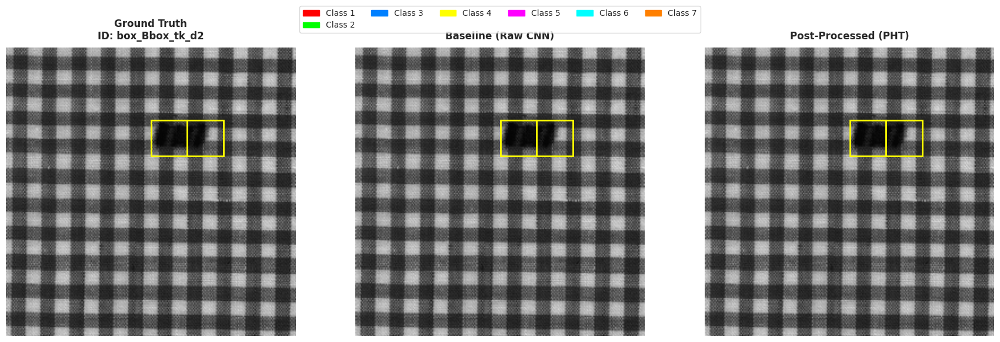

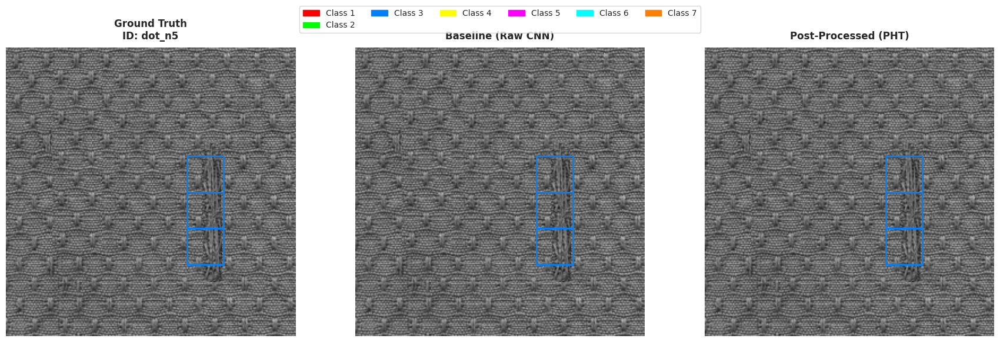

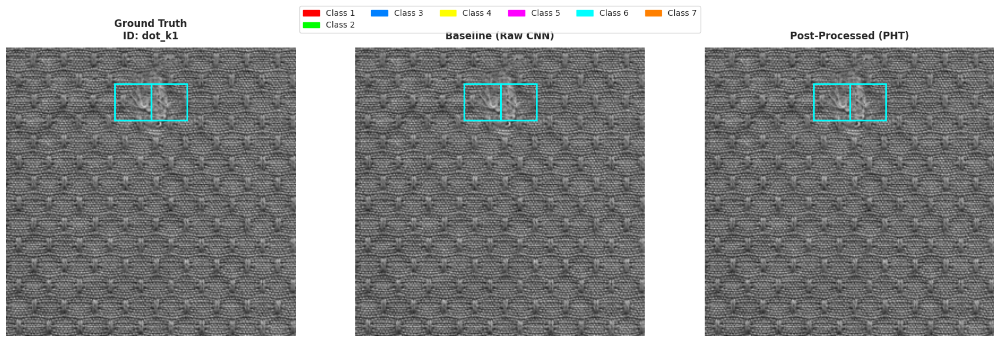

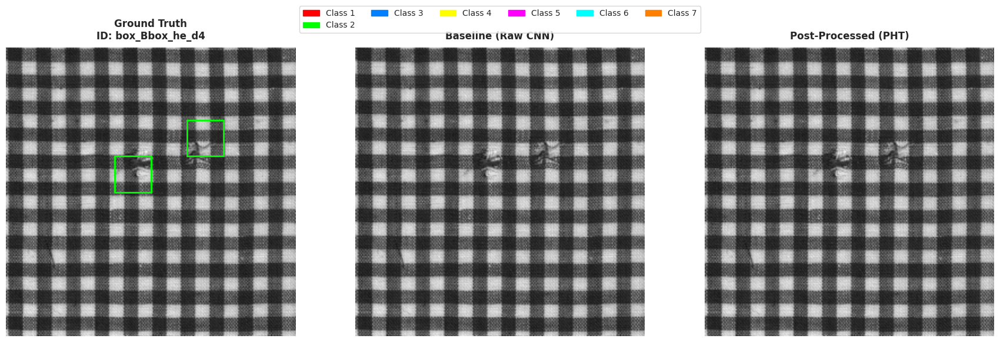

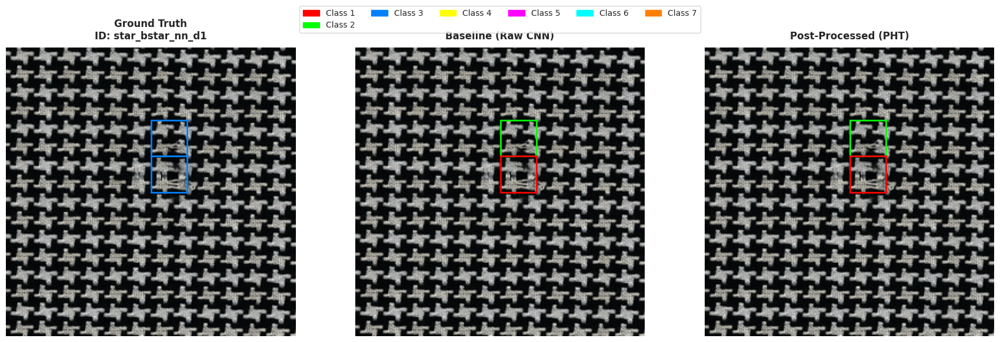

...

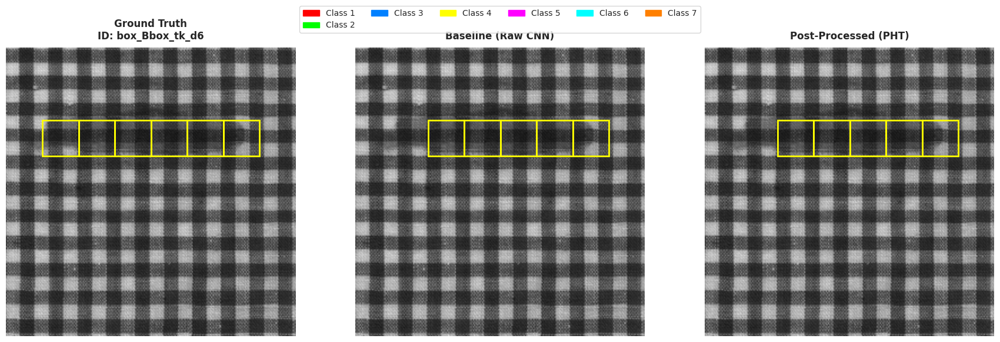

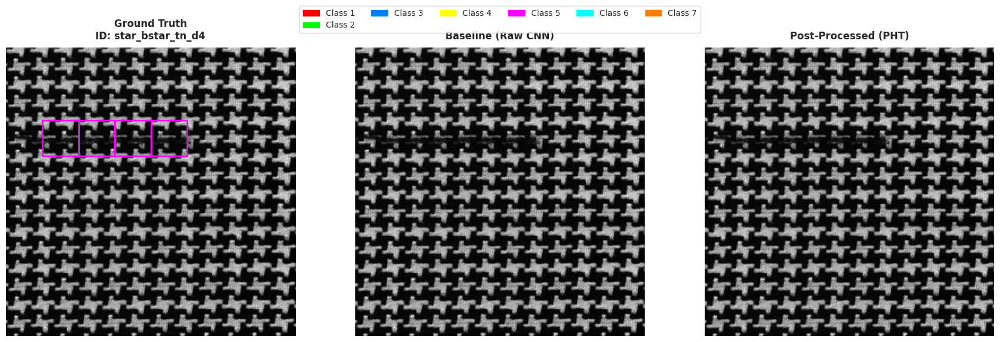

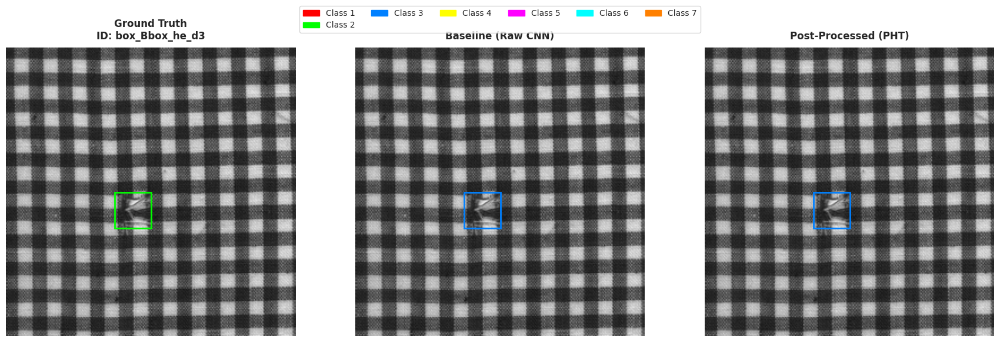

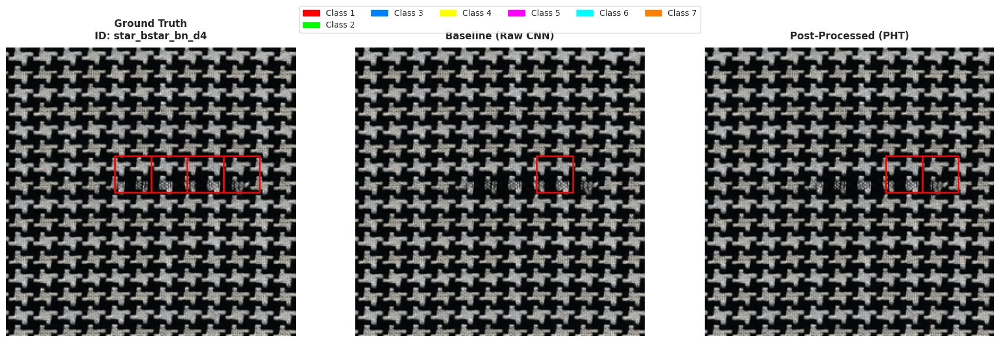

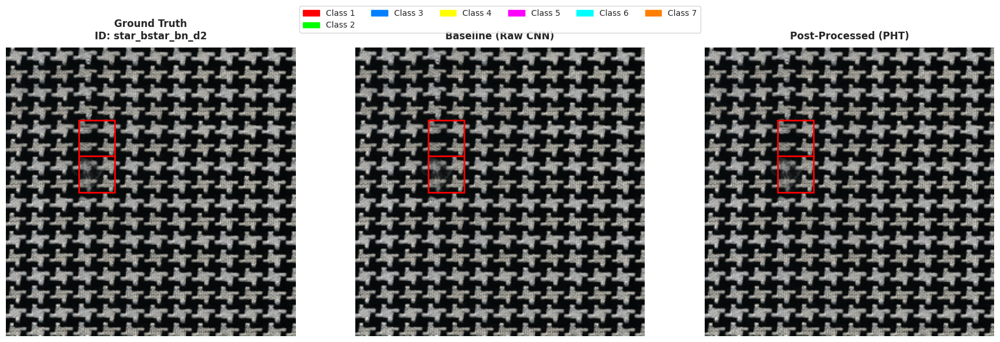


[SUCCESS] Reconstructed and exported 16 qualitative inspection plots to '/kaggle/working/experiments/'.

=== PIPELINE: RECONSTRUCTING CANVASES FROM HDF5 DATASET ===
[INFO] Identified 80 defective images for qualitative reconstruction.


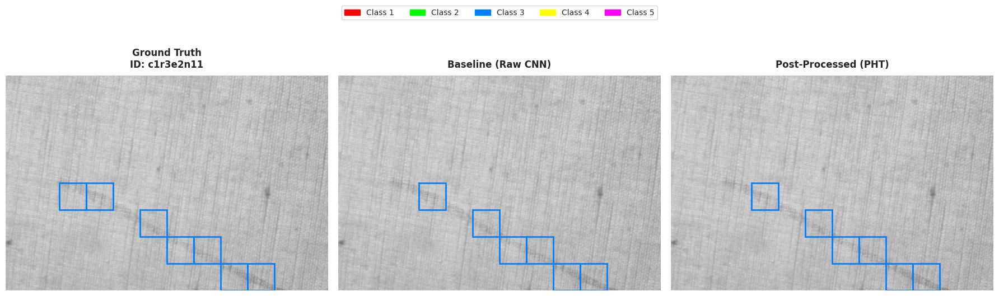

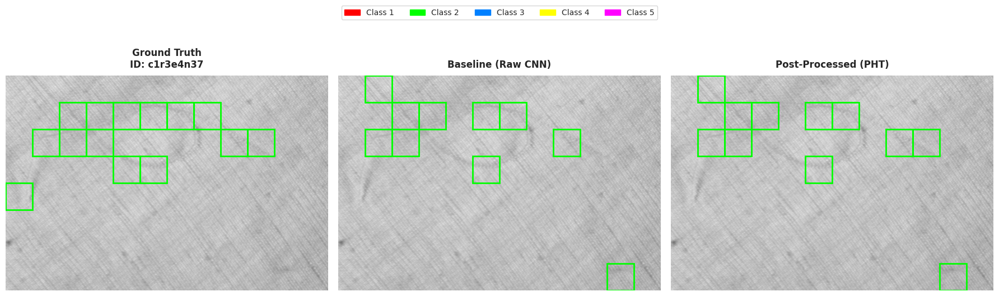

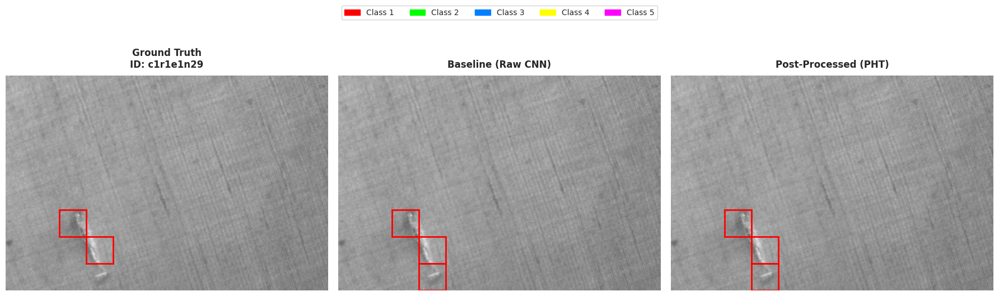

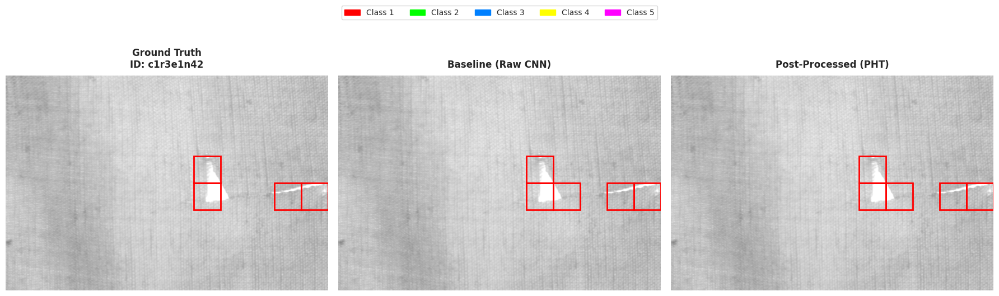

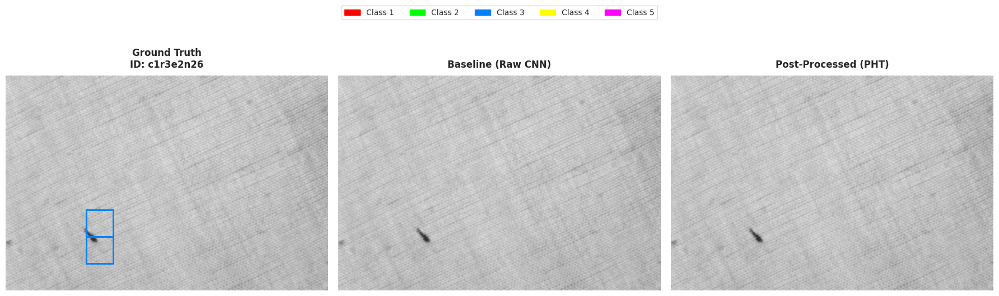

...

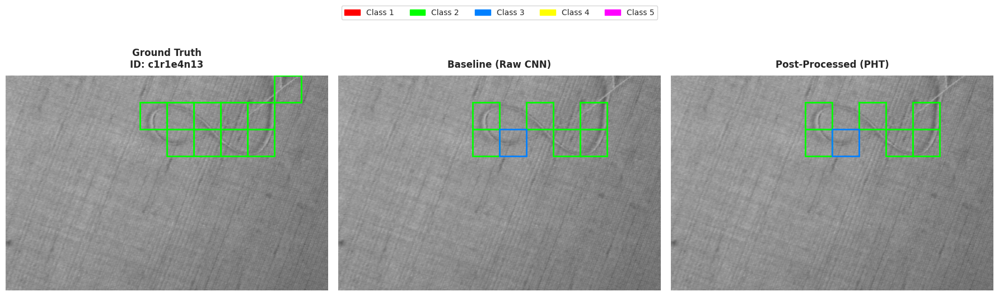

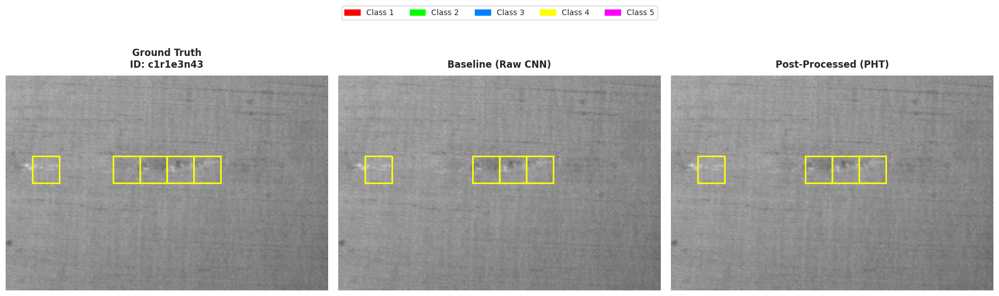

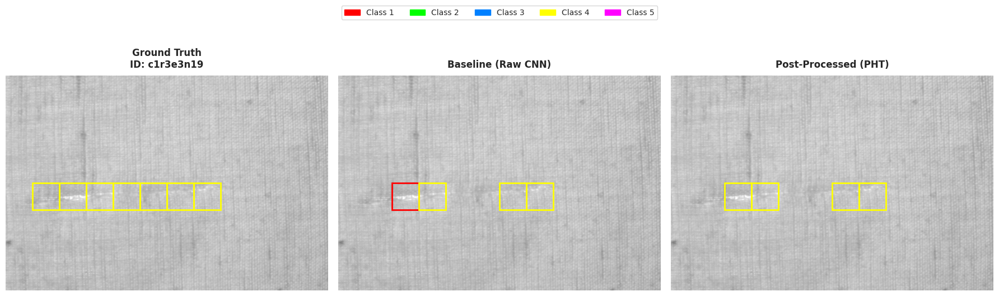

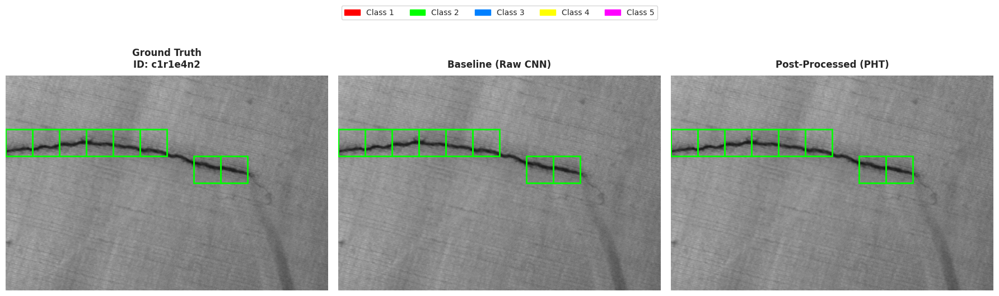

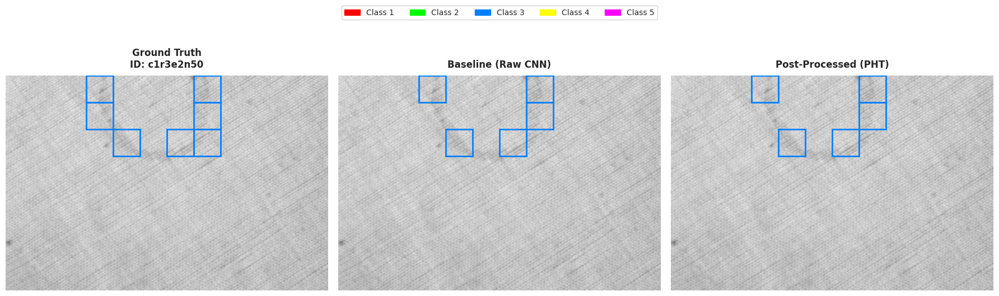


[SUCCESS] Reconstructed and exported 80 qualitative inspection plots to '/kaggle/working/experiments/'.


In [30]:
plot_defective_images(
    df=df_hku,
    patch_dataset=CONFIGS["HKU"]["test_set_path"],
    patch_size = CONFIGS["HKU"]["patch_size"],
    num_classes = hku_num_classes,
    class_colors= CLASS_COLORS,
    output_dir= "/kaggle/working/experiments",
)

plot_defective_images(
    df=df_tilda,
    patch_dataset=CONFIGS["TILDA"]["test_set_path"],
    patch_size = CONFIGS["TILDA"]["patch_size"],
    num_classes = tilda_num_classes,
    class_colors= CLASS_COLORS,
    output_dir= "/kaggle/working/experiments",
)